In [41]:
import math
import numpy as np
import matplotlib.pyplot as plt
import pickle
import os
import lidar_sim_class_declarations
import importlib
from datetime import datetime
import pandas as pd


importlib.reload(lidar_sim_class_declarations)

output_path = 'C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/output_008/'

# Leaf Density ratio
# redwood_leaf_density_ratio = 2500  # Leaves per m3
# guiana_leaf_density_ratio = 87.5  # Leaves per m3  Original 8750 number divided by 100 for more realistic density per m3
# guiana_leaf_density_ratio = 8750/20  # Leaves per m3  Original 8750 number divided by 20 for more realistic density per m3 = 437.5

radius = 33.3 / 2
section_range = 0.1  # specifies section size.  (0.1 means section is per 0.1 meters)

In [42]:
def save_objects_to_file(objects_list, filename, subfolder=""):
    # Create the subfolder if it doesn't exist
    if subfolder:
        os.makedirs(subfolder, exist_ok=True)
        filename = os.path.join(subfolder, filename)
        
    # Save the objects to file
    with open(filename, 'wb') as f:
        pickle.dump(objects_list, f)

def load_objects_from_file(filename, subfolder=""):
    # Adjust the filename to include the subfolder
    if subfolder:
        filename = os.path.join(subfolder, filename)
        
    # Load the objects from file
    with open(filename, 'rb') as f:
        objects_list = pickle.load(f)
    
    return objects_list

def get_date_subfolder():
    current_date = datetime.now()
    return current_date.strftime('%Y_%m_%d')

In [43]:
redwood_tree_objects_branch_orig = load_objects_from_file("redwood_tree_objects_branch_orig.pkl", subfolder="object_data")
redwood_tree_objects_branch_origB10th = load_objects_from_file("redwood_tree_objects_branch_origB10th.pkl", subfolder="object_data")
guiana_tree_objects_leaf_orig = load_objects_from_file("guiana_tree_objects_leaf_orig.pkl", subfolder="object_data")
guiana_tree_objects_leaf_div10 = load_objects_from_file("guiana_tree_objects_leaf_div10.pkl", subfolder="object_data")
guiana_tree_objects_leaf_div30 = load_objects_from_file("guiana_tree_objects_leaf_div30.pkl", subfolder="object_data")
redwood_circle_objects_orig = load_objects_from_file("redwood_circle_objects_orig.pkl", subfolder="object_data")
redwood_circle_objects_branch_origB10th = load_objects_from_file("redwood_circle_objects_origB10th.pkl", subfolder="object_data")
guiana_circle_objects_leaf_orig = load_objects_from_file("guiana_circle_objects_leaf_orig.pkl", subfolder="object_data")
guiana_circle_objects_leaf_div10 = load_objects_from_file("guiana_circle_objects_leaf_div10.pkl", subfolder="object_data")
guiana_circle_objects_leaf_div30 = load_objects_from_file("guiana_circle_objects_leaf_div30.pkl", subfolder="object_data")

for tree in redwood_tree_objects_branch_orig:
    tree.print_attributes()
    print()
for tree in guiana_tree_objects_leaf_orig:
    tree.print_attributes()
    print()

date_subfolder = get_date_subfolder()

tree_index: 1
x_coord: -58.22
y_coord: 39.89
crown_base: 6.53279
crown_d1: 4.75503
crown_d2: 2.70483
crown_d3: 9.46251
crown_base_height: 6.509015
crown_center_height: 11.264045
tree_height: 16.019075
crown_volume: 145.72089163029327
single_leaf_area: 6e-05
total_leaf_area: 21.858133744543988
total_tree_branch_area: 509.1073367371114
total_tree_stem_area: 0
total_tree_ground_area: 22.984222754161376
total_tree_canopy_veg_area: 530.9654704816554
leaf_density: 2500
branch_scale: 1

tree_index: 2
x_coord: -58.43
y_coord: 32.12
crown_base: 7.02676
crown_d1: 5.83397
crown_d2: 3.09267
crown_d3: 11.6096
crown_base_height: 6.99759
crown_center_height: 12.83156
tree_height: 18.66553
crown_volume: 233.732962642793
single_leaf_area: 6e-05
total_leaf_area: 35.05994439641895
total_tree_branch_area: 808.3898341710008
total_tree_stem_area: 0
total_tree_ground_area: 30.048101375580398
total_tree_canopy_veg_area: 843.4497785674197
leaf_density: 2500
branch_scale: 1

tree_index: 3
x_coord: -62.59
y_coor

In [44]:
for circle in redwood_circle_objects_orig:
    circle.print_attributes()
    print()
for circle in guiana_circle_objects_leaf_orig:
    circle.print_attributes()
    print()

circle_name: Circle(3, 1)
x_coord: -33.300000
y_coord: 33.300000
row: 3
column: 1
tree_indices: [ 7 14 15 16 17 19 20 26 27 28 29 37 39 51 53]
crown_vol_in_circle: [ 248.26696059    0.32523409   34.91988234  495.41275132  504.32625546
  171.29795503  401.21370334  150.14615303 1002.6985605   337.14874305
  515.6410405  4884.29356445  441.46961146  504.25205435  410.04984457]
crown_percentages: [0.39477425 0.00057048 0.15108792 0.99471357 1.         0.69163379
 0.08520866 0.32263391 0.96574886 1.         0.50879085 1.
 1.         1.         0.84088965]
tree_heights: [25.94412 26.03559 19.14973 23.71524 23.94105 19.64225 41.67815 23.85574
 29.03983 20.77117 29.2986  42.18075 23.12683 25.44789 23.62493]
single_leaf_areas: [0.00006 0.00006 0.00006 0.00006 0.00006 0.00006 0.00006 0.00006 0.00006
 0.00006 0.00006 0.00006 0.00006 0.00006 0.00006]
adj_branch_areas: [  834.30602445     1.13137509   126.25371276  1658.47065431
  1698.99037967   602.45436635  1353.60632675   529.65886593
  3322.2

In [45]:
def calculate_Li_dz(circle, trees, section_range, leaf_density):
    num_trees = len(circle.tree_indices)
    max_tree_height = max(trees[tree_index - 1].tree_height for tree_index in circle.tree_indices)

    circle.Li_dz_leaf = np.zeros((num_trees, math.ceil(max_tree_height / section_range) + 1))
    circle.Li_dz_branch = np.zeros((num_trees, math.ceil(max_tree_height / section_range) + 1))
    circle.Fa_array = np.zeros((num_trees, math.ceil(max_tree_height / section_range) + 1))
    circle.Fa_b_array = np.zeros((num_trees, math.ceil(max_tree_height / section_range) + 1))
    circle.Fa_leaf_branch_per_tree = np.zeros(num_trees)
    
    # Create the array of heights by section range
    circle.tree_height_array = np.arange(0, max_tree_height + section_range, section_range)[:math.ceil(max_tree_height / section_range) + 1]
    tree_height_array = circle.tree_height_array

    # with np.printoptions(threshold=np.inf):
    #     print(f"Max Tree Height: {max_tree_height}")
    #     print(circle.tree_height_array)
    
    for tree in trees:
        single_leaf_area = tree.single_leaf_area
        break

    Fa = leaf_density * single_leaf_area
    circle.new_Fa = Fa
    # print(f"circle_name: {circle.circle_name}")
    LAI = circle.LAI_with_branch
    LAI_b = circle.LAI_without_branch
    print(f"LAI_with_branch: {LAI}")
    print(f"LAI_without_branch: {LAI_b}")
    print(f"Fa = leaf_density: {leaf_density} * single_leaf_area: {single_leaf_area}")
    print(f"Fa: {Fa}")
    print(f"Old Fa: {circle.Fa}")
    print(f"Old Fa_b: {circle.Fa_b}")

    for index, tree_index in enumerate(circle.tree_indices):
        tree = trees[tree_index - 1]  # Adjust for 0-based index

        tree_height = tree.tree_height
        crown_volume = tree.crown_volume
        total_branch_area = tree.total_tree_branch_area
        crown_percentage = circle.crown_percentages[index]
        crown_base_height = tree.crown_base_height
        crown_radius = tree.crown_d2
        crown_center_height = tree.crown_center_height
        crown_vertical_radius = tree_height - crown_center_height

        Fa_leaf_branch_per_tree = Fa + total_branch_area/crown_volume
        # print(f"Tree {tree_index}:")
        # print(f"4/3 * crown_radius: {crown_radius} ^2 * crown_vertical_radius: {crown_vertical_radius} = crown_volume: {crown_volume}")
        # print (f"Fa leaf only: {Fa} + total_branch_area: {total_branch_area} / crown_volume: {crown_volume}")
        # print (f"Fa leaf and branch: {Fa_leaf_branch_per_tree}")
        circle.Fa_leaf_branch_per_tree[index] = Fa_leaf_branch_per_tree

        Fa_array, Fa_b_array, Li_dz_leaf, Li_dz_branch = calculate_Li_dz_per_section(Fa, Fa_leaf_branch_per_tree, crown_percentage, crown_base_height, crown_radius, crown_center_height, crown_vertical_radius, tree_height, tree_height_array, section_range)
        circle.Li_dz_leaf[index, :len(Li_dz_leaf)] = Li_dz_leaf
        circle.Li_dz_branch[index, :len(Li_dz_branch)] = Li_dz_branch
        circle.Fa_array[index, :len(Fa_array)] = Fa_array
        circle.Fa_b_array[index, :len(Fa_b_array)] = Fa_b_array
    
    print()

def calculate_Li_dz_per_section(Fa, Fa_leaf_branch_per_tree, crown_percentage, crown_base_height, crown_radius, crown_center_height, crown_vertical_radius, tree_height, tree_height_array, section_range):
    # Calculate the number of sections
    num_sections = len(tree_height_array)

    # Initialize NumPy arrays to store leaf area, veg area, and volume per range height
    Li_dz_leaf_per_range = np.zeros(num_sections, dtype=float)
    Li_dz_branch_per_range = np.zeros(num_sections, dtype=float)
    Fa_array = np.zeros(num_sections, dtype=float)
    Fa_b_array = np.zeros(num_sections, dtype=float)

    # Calculate the leaf area, veg area, and volume for the rest of the ranges
    for i in range(int(crown_base_height / section_range), int(tree_height / section_range) + 1):
        Li_dz_leaf_per_range_single = Fa * math.pi * crown_radius**2 * abs(1- ((tree_height_array[i] - crown_center_height)/crown_vertical_radius)**2)
        Li_dz_leaf_per_range[i] += Li_dz_leaf_per_range_single * crown_percentage
        Li_dz_branch_per_range_single = Fa_leaf_branch_per_tree * math.pi * crown_radius**2 * abs(1- ((tree_height_array[i] - crown_center_height)/crown_vertical_radius)**2)
        Li_dz_branch_per_range[i] += Li_dz_branch_per_range_single * crown_percentage
        Fa_array[i] = Fa
        Fa_b_array[i] = Fa_leaf_branch_per_tree

    ### This section is a vestige of cylindrical volume calculations
    # # Calculate the proportion of the first range occupied by the crown
    # proportion_first_range = 1.0 - (crown_base_height % section_range)
    # # Calculate the proportion of the last range occupied by the crown
    # proportion_last_range = (tree_height % section_range) / section_range

    # if proportion_first_range != 0:
    #     Li_dz_leaf_per_range[int(crown_base_height / section_range)] *=  proportion_first_range
    #     Li_dz_branch_per_range[int(crown_base_height / section_range)] *= proportion_first_range
    # if proportion_last_range != 0:
    #     Li_dz_leaf_per_range[int(tree_height / section_range)] *= proportion_last_range
    #     Li_dz_branch_per_range[int(tree_height / section_range)] *= proportion_last_range

    return Fa_array, Fa_b_array, Li_dz_leaf_per_range, Li_dz_branch_per_range

# def calculate_Li_dz_per_section_TEAK():

In [46]:
for tree in redwood_tree_objects_branch_orig:
    redwood_leaf_density_ratio = tree.leaf_density
    break

for circle in redwood_circle_objects_orig:
    calculate_Li_dz(circle, redwood_tree_objects_branch_orig, section_range, redwood_leaf_density_ratio)
    circle.total_Li_dz_leaf = np.sum(circle.Li_dz_leaf, axis=0)/circle.pixel_area
    circle.total_Li_dz_branch = np.sum(circle.Li_dz_branch, axis=0)/circle.pixel_area
    circle.total_Fa = np.sum(circle.Fa_array, axis=0)/circle.pixel_area
    circle.total_Fa_b = np.sum(circle.Fa_b_array, axis=0)/circle.pixel_area
    circle.acc_LAI_leaf = np.cumsum(circle.total_Li_dz_leaf[::-1])[::-1] * section_range
    circle.acc_LAI_branch = np.cumsum(circle.total_Li_dz_branch[::-1])[::-1] * section_range

    with np.printoptions(threshold=np.inf):
        print(f"Circle: {circle.circle_name}")
        # print(np.sum(circle.Li_dz_leaf)/circle.new_Fa)
        # print(np.sum(circle.total_Li_dz_leaf * circle.pixel_area/circle.new_Fa))
        # print(circle.total_Li_dz_leaf)
        # print(circle.total_Li_dz_branch)
        print(circle.Fa_array)
        # print(circle.Fa_b_array)
        print(circle.total_Fa)
        # print(circle.total_Fa_b)
        # print(circle.acc_LAI_leaf)
        # print(circle.acc_LAI_branch)

for circle in redwood_circle_objects_branch_origB10th:
    calculate_Li_dz(circle, redwood_tree_objects_branch_origB10th, section_range, redwood_leaf_density_ratio)
    circle.total_Li_dz_leaf = np.sum(circle.Li_dz_leaf, axis=0)/circle.pixel_area
    circle.total_Li_dz_branch = np.sum(circle.Li_dz_branch, axis=0)/circle.pixel_area
    circle.total_Fa = np.sum(circle.Fa_array, axis=0)/circle.pixel_area
    circle.total_Fa_b = np.sum(circle.Fa_b_array, axis=0)/circle.pixel_area
    circle.acc_LAI_leaf = np.cumsum(circle.total_Li_dz_leaf[::-1])[::-1] * section_range
    circle.acc_LAI_branch = np.cumsum(circle.total_Li_dz_branch[::-1])[::-1] * section_range
    # print(circle.total_Li_dz_branch)

for tree in guiana_tree_objects_leaf_orig:
    guiana_leaf_density_ratio = tree.leaf_density
    break
for tree in guiana_tree_objects_leaf_div10:
    guiana_leaf_density_ratio_div10 = tree.leaf_density
    break
for tree in guiana_tree_objects_leaf_div30:
    guiana_leaf_density_ratio_div30 = tree.leaf_density
    break

for circle in guiana_circle_objects_leaf_orig:
    calculate_Li_dz(circle, guiana_tree_objects_leaf_orig, section_range, guiana_leaf_density_ratio)
    circle.total_Li_dz_leaf = np.sum(circle.Li_dz_leaf, axis=0)/circle.pixel_area
    circle.total_Li_dz_branch = np.sum(circle.Li_dz_branch, axis=0)/circle.pixel_area
    circle.total_Fa = np.sum(circle.Fa_array, axis=0)/circle.pixel_area
    circle.total_Fa_b = np.sum(circle.Fa_b_array, axis=0)/circle.pixel_area
    circle.acc_LAI_leaf = np.cumsum(circle.total_Li_dz_leaf[::-1])[::-1] * section_range
    circle.acc_LAI_branch = np.cumsum(circle.total_Li_dz_branch[::-1])[::-1] * section_range

for circle in guiana_circle_objects_leaf_div10:
    calculate_Li_dz(circle, guiana_tree_objects_leaf_div10, section_range, guiana_leaf_density_ratio_div10)
    circle.total_Li_dz_leaf = np.sum(circle.Li_dz_leaf, axis=0)/circle.pixel_area
    circle.total_Li_dz_branch = np.sum(circle.Li_dz_branch, axis=0)/circle.pixel_area
    circle.total_Fa = np.sum(circle.Fa_array, axis=0)/circle.pixel_area
    circle.total_Fa_b = np.sum(circle.Fa_b_array, axis=0)/circle.pixel_area
    circle.acc_LAI_leaf = np.cumsum(circle.total_Li_dz_leaf[::-1])[::-1] * section_range
    circle.acc_LAI_branch = np.cumsum(circle.total_Li_dz_branch[::-1])[::-1] * section_range

for circle in guiana_circle_objects_leaf_div30:
    calculate_Li_dz(circle, guiana_tree_objects_leaf_div30, section_range, guiana_leaf_density_ratio_div30)
    circle.total_Li_dz_leaf = np.sum(circle.Li_dz_leaf, axis=0)/circle.pixel_area
    circle.total_Li_dz_branch = np.sum(circle.Li_dz_branch, axis=0)/circle.pixel_area
    circle.total_Fa = np.sum(circle.Fa_array, axis=0)/circle.pixel_area
    circle.total_Fa_b = np.sum(circle.Fa_b_array, axis=0)/circle.pixel_area
    circle.acc_LAI_leaf = np.cumsum(circle.total_Li_dz_leaf[::-1])[::-1] * section_range
    circle.acc_LAI_branch = np.cumsum(circle.total_Li_dz_branch[::-1])[::-1] * section_range

LAI_with_branch: 41.72146138592626
LAI_without_branch: 1.7397913153596438
Fa = leaf_density: 2500 * single_leaf_area: 6e-05
Fa: 0.15
Old Fa: 0.15000000000000002
Old Fa_b: 3.5971091202942707

Circle: Circle(3, 1)
[[0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.15 0.15
  0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15
  0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15
  0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15
  0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15 0.15
  0.15 0

In [47]:
print(guiana_leaf_density_ratio)
print(guiana_leaf_density_ratio_div10)
print(guiana_leaf_density_ratio_div30)

for circle in guiana_circle_objects_leaf_div30:
    calculate_Li_dz(circle, guiana_tree_objects_leaf_div30, section_range, guiana_leaf_density_ratio_div30)
    circle.total_Li_dz_leaf = np.sum(circle.Li_dz_leaf, axis=0)/circle.pixel_area
    circle.total_Li_dz_branch = np.sum(circle.Li_dz_branch, axis=0)/circle.pixel_area
    circle.total_Fa = np.sum(circle.Fa_array, axis=0)/circle.pixel_area
    circle.total_Fa_b = np.sum(circle.Fa_b_array, axis=0)/circle.pixel_area
    circle.acc_LAI_leaf = np.cumsum(circle.total_Li_dz_leaf[::-1])[::-1] * section_range
    circle.acc_LAI_branch = np.cumsum(circle.total_Li_dz_branch[::-1])[::-1] * section_range

    with np.printoptions(threshold=np.inf):
        print(f"Circle: {circle.circle_name}")
        # print(circle.total_Li_dz_leaf)
        # print("total_Li_dz_branch", circle.total_Li_dz_branch)
        # print(circle.total_Fa)
        # print(circle.total_Fa_b)
        print(circle.acc_LAI_leaf)
        print(circle.acc_LAI_branch)

8750
875
291.5
LAI_with_branch: 7.288367679520273
LAI_without_branch: 5.797348646515122
Fa = leaf_density: 291.5 * single_leaf_area: 0.01161
Fa: 3.384315
Old Fa: 3.3843149999999995
Old Fa_b: 4.25472635290666

Circle: Circle(3, 1)
[5.79986884 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884
 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884
 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884
 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884
 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884
 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884
 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884
 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884
 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884
 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884
 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884 5.79986884
 5.79982256 5.79976118 5.7995976 

In [48]:
for circle in redwood_circle_objects_branch_origB10th:
    print(f"Circle Name: {circle.circle_name}")
    print(f"Leaf Fa: {circle.new_Fa}")

    # with np.printoptions(threshold=np.inf):

    for i, tree_index in enumerate(circle.tree_indices):
        print(f"Tree {tree_index} Leaf and Branch Fa: {circle.Fa_leaf_branch_per_tree[i]}")

Circle Name: Circle(3, 1)
Leaf Fa: 0.15
Tree 7 Leaf and Branch Fa: 0.4860519750474034
Tree 14 Leaf and Branch Fa: 0.49786485450424656
Tree 15 Leaf and Branch Fa: 0.5115525148168999
Tree 16 Leaf and Branch Fa: 0.48476543546788864
Tree 17 Leaf and Branch Fa: 0.4868831904494565
Tree 19 Leaf and Branch Fa: 0.5016996838851843
Tree 20 Leaf and Branch Fa: 0.4873778900060862
Tree 26 Leaf and Branch Fa: 0.5027621955363674
Tree 27 Leaf and Branch Fa: 0.4813320153161148
Tree 28 Leaf and Branch Fa: 0.48396894782448496
Tree 29 Leaf and Branch Fa: 0.48593351999367307
Tree 37 Leaf and Branch Fa: 0.5024404927669545
Tree 39 Leaf and Branch Fa: 0.49639307789975473
Tree 51 Leaf and Branch Fa: 0.49695946875296215
Tree 53 Leaf and Branch Fa: 0.47740602078233985
Circle Name: Circle(3, 2)
Leaf Fa: 0.15
Tree 25 Leaf and Branch Fa: 0.48710160818827963
Tree 52 Leaf and Branch Fa: 0.4975118508571593
Tree 54 Leaf and Branch Fa: 0.49841911122390736
Tree 64 Leaf and Branch Fa: 0.48775614142606416
Tree 65 Leaf and B

In [49]:
for tree in guiana_tree_objects_leaf_div30:
    leaf_area = tree.single_leaf_area
    break


for circle in guiana_circle_objects_leaf_orig:
    print(f"Circle Name: {circle.circle_name}")
    print(f"Single Leaf Area: {leaf_area}")
    print(f"Leaf Density: {guiana_leaf_density_ratio}")
    print(f"Leaf Fa: {circle.new_Fa}")
    print(f"LAI: {circle.LAI_without_branch}")
    print(f"Total Crown Volume: {np.sum(circle.crown_vol_in_circle)}")

    # with np.printoptions(threshold=np.inf):

    for i, tree_index in enumerate(circle.tree_indices):
        print(f"Tree {tree_index} Leaf and Branch Fa: {circle.Fa_leaf_branch_per_tree[i]}")


Circle Name: Circle(3, 1)
Single Leaf Area: 0.01161
Leaf Density: 8750
Leaf Fa: 101.5875
LAI: 174.01989933793243
Total Crown Volume: 1491.8906382386403
Tree 8 Leaf and Branch Fa: 102.49360606655462
Tree 12 Leaf and Branch Fa: 102.44072502265286
Tree 19 Leaf and Branch Fa: 102.49684473412063
Tree 30 Leaf and Branch Fa: 102.48372555667187
Tree 44 Leaf and Branch Fa: 102.52013747396154
Tree 59 Leaf and Branch Fa: 102.54497675533887
Tree 65 Leaf and Branch Fa: 102.50527855612569
Tree 70 Leaf and Branch Fa: 102.58381423916232
Tree 73 Leaf and Branch Fa: 102.56079522397324
Tree 75 Leaf and Branch Fa: 102.41667842045291
Tree 76 Leaf and Branch Fa: 102.4848314372207
Tree 90 Leaf and Branch Fa: 102.49776800397919
Tree 92 Leaf and Branch Fa: 102.56534796517346
Tree 95 Leaf and Branch Fa: 102.50526172996608
Tree 98 Leaf and Branch Fa: 102.50339603214033
Tree 109 Leaf and Branch Fa: 102.45059059164771
Tree 110 Leaf and Branch Fa: 102.47455427512163
Tree 112 Leaf and Branch Fa: 102.39390064142918
T

In [50]:
for circle in guiana_circle_objects_leaf_div30:
    print(f"Circle Name: {circle.circle_name}")
    print(f"Single Leaf Area: {leaf_area}")
    print(f"Leaf Density: {guiana_leaf_density_ratio_div30}")
    print(f"Leaf Fa: {circle.new_Fa}")
    print(f"LAI: {circle.LAI_without_branch}")
    print(f"Total Crown Volume: {np.sum(circle.crown_vol_in_circle)}")

    # with np.printoptions(threshold=np.inf):

    for i, tree_index in enumerate(circle.tree_indices):
        print(f"Tree {tree_index} Leaf and Branch Fa: {circle.Fa_leaf_branch_per_tree[i]}")

Circle Name: Circle(3, 1)
Single Leaf Area: 0.01161
Leaf Density: 291.5
Leaf Fa: 3.384315
LAI: 5.797348646515122
Total Crown Volume: 1491.8906382386403
Tree 8 Leaf and Branch Fa: 4.290421066554616
Tree 12 Leaf and Branch Fa: 4.237540022652846
Tree 19 Leaf and Branch Fa: 4.293659734120626
Tree 30 Leaf and Branch Fa: 4.2805405566718635
Tree 44 Leaf and Branch Fa: 4.316952473961532
Tree 59 Leaf and Branch Fa: 4.3417917553388605
Tree 65 Leaf and Branch Fa: 4.302093556125683
Tree 70 Leaf and Branch Fa: 4.380629239162316
Tree 73 Leaf and Branch Fa: 4.357610223973245
Tree 75 Leaf and Branch Fa: 4.213493420452911
Tree 76 Leaf and Branch Fa: 4.281646437220697
Tree 90 Leaf and Branch Fa: 4.2945830039791835
Tree 92 Leaf and Branch Fa: 4.3621629651734555
Tree 95 Leaf and Branch Fa: 4.302076729966075
Tree 98 Leaf and Branch Fa: 4.300211032140324
Tree 109 Leaf and Branch Fa: 4.24740559164771
Tree 110 Leaf and Branch Fa: 4.271369275121625
Tree 112 Leaf and Branch Fa: 4.190715641429175
Tree 115 Leaf a

In [51]:
def plot_circle_fp_with_subplots(circle_objects, section_range, data_type, sup_title, path, file_prefix, scale_qualifier):
    plt.rcParams['axes.titlesize'] = 20
    plt.rcParams['axes.labelsize'] = 20
    plt.rcParams['xtick.labelsize'] = 20
    plt.rcParams['ytick.labelsize'] = 20

    fig, axes = plt.subplots(3, 3, figsize=(20, 20))

    os.makedirs(path, exist_ok=True)

    for i, (circle, ax) in enumerate(zip(circle_objects, axes.flat)):
        if data_type == 'leaf':
            x_data = circle.total_Li_dz_leaf
            y_data = np.arange(len(circle.total_Li_dz_leaf)) * section_range

            ax.plot(x_data, y_data, color='blue')
            ax.set_title(f"Circle: {circle.circle_name}")
            ax.set_xlabel('Foliage Density Profile (m^2/m^3)')
            ax.set_ylabel('Height (m)')
        elif data_type == 'veg':
            x_data = circle.total_Li_dz_branch
            y_data = np.arange(len(circle.total_Li_dz_branch)) * section_range

            ax.plot(x_data, y_data, color='red')
            ax.set_title(f"Circle: {circle.circle_name}")
            ax.set_xlabel('Foliage Density Profile (m^2/m^3)')
            ax.set_ylabel('Height (m)')
        else:
            print("Invalid data type. Please provide either 'leaf' or 'veg'.")
            return
        
        max_data_length = max(len(circle.total_Li_dz_leaf) for circle in circle_objects)
        ax.set_ylim(0, max_data_length * section_range)

        # ax.set_ylim(0, len(circle.total_leaf_area_per_meter_range) * section_range)  # Set y-axis limits
        
        # Rotate x-axis tick labels
        ax.tick_params(axis='x', rotation=30)
    
    fig.suptitle(sup_title + "_" + scale_qualifier, fontsize=20)
    fig.tight_layout(rect=[0, 0.03, 1, 0.98])  # Adjust rect for title position
    
    # Save the figure as PNG with a custom filename
    fp_path = path + "/foliage_profile/"

    if not os.path.exists(fp_path):
        os.makedirs(fp_path)

    fig.savefig(f"{fp_path}{file_prefix}_{scale_qualifier}_{data_type}_fp.png")

    plt.show()

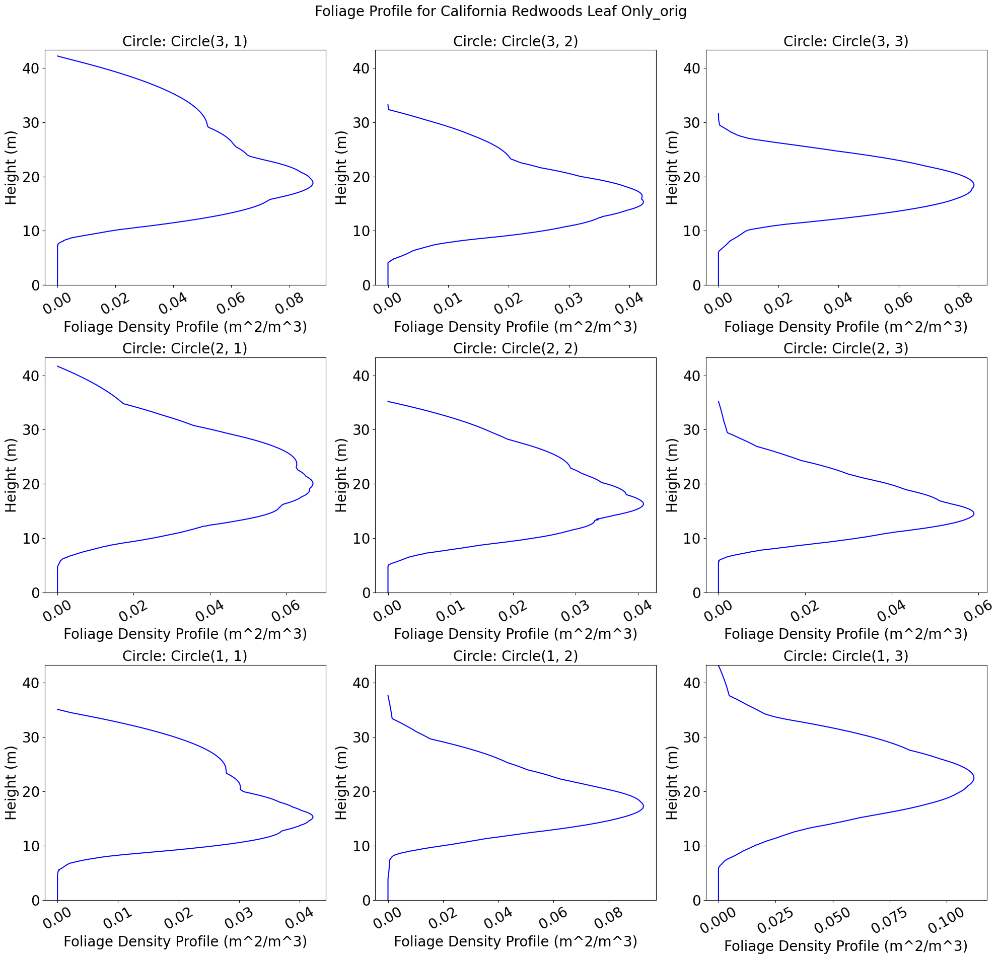

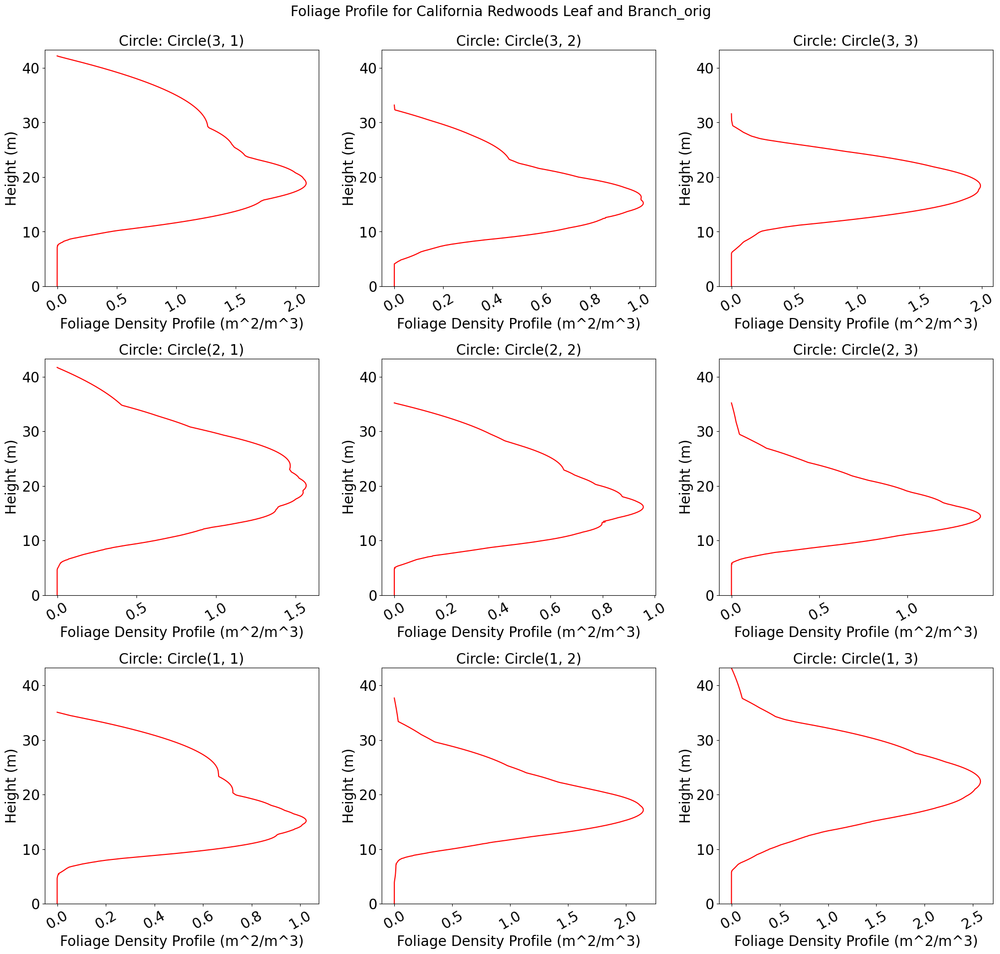

In [52]:
fp_file_path = os.path.join(output_path, date_subfolder)

# Plot total leaf only foliage profile per meter for each circle
plot_circle_fp_with_subplots(redwood_circle_objects_orig, section_range, 'leaf', 'Foliage Profile for California Redwoods Leaf Only', fp_file_path, 'redwood', 'orig')

# Plot total leaf and branch foliage profile per meter for each circle
plot_circle_fp_with_subplots(redwood_circle_objects_orig, section_range, 'veg', 'Foliage Profile for California Redwoods Leaf and Branch', fp_file_path, 'redwood', 'orig')

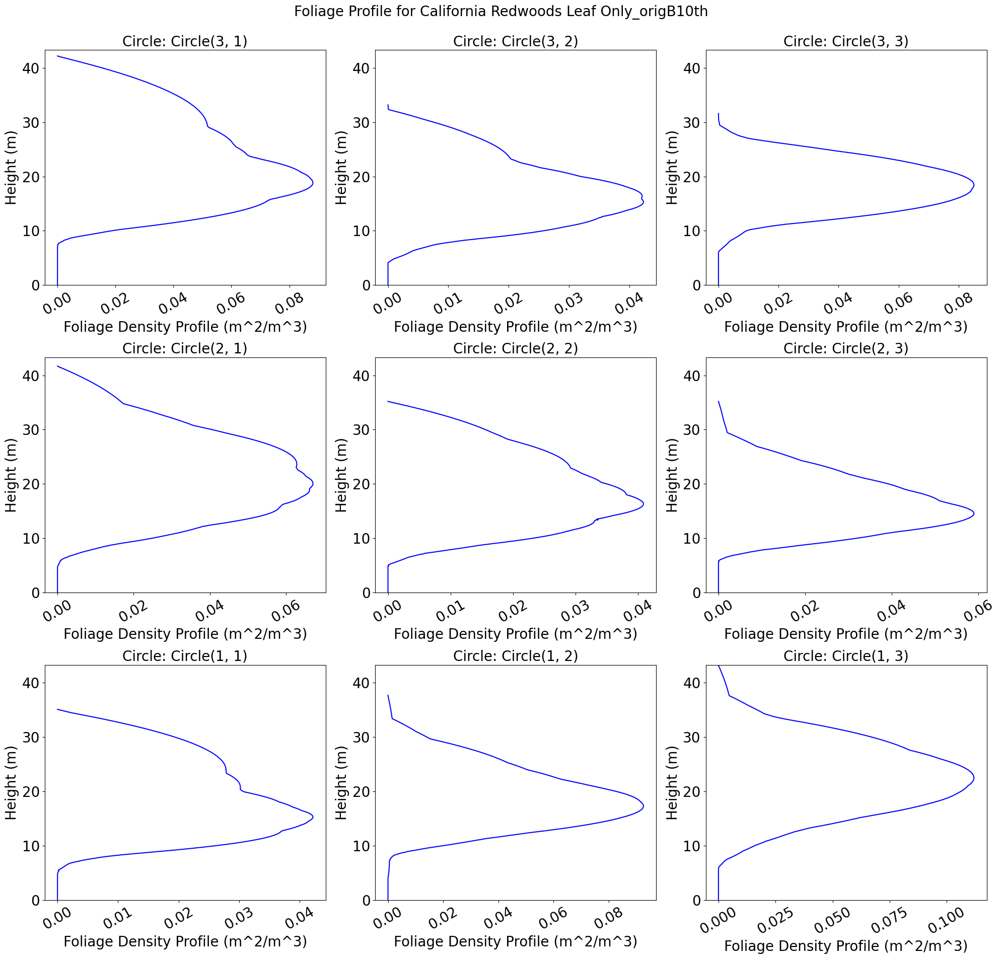

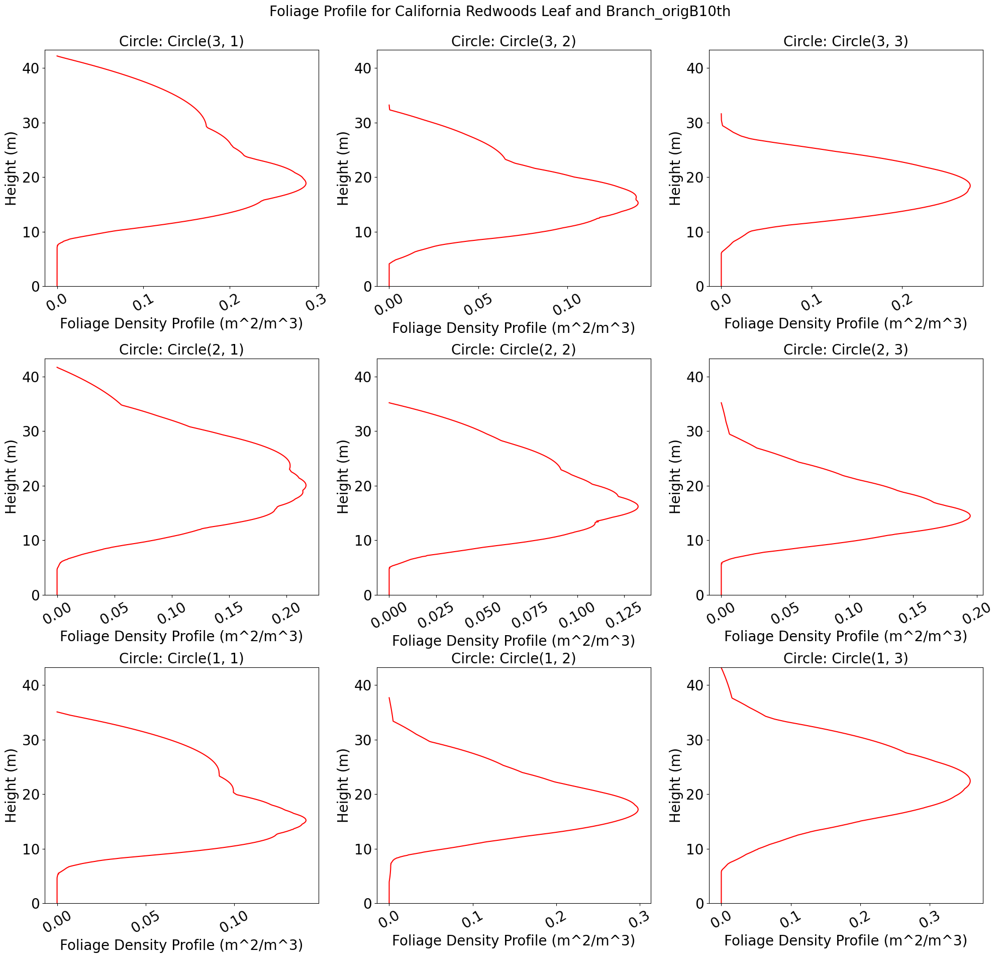

In [53]:
# Plot total leaf only foliage profile per meter for each circle
plot_circle_fp_with_subplots(redwood_circle_objects_branch_origB10th, section_range, 'leaf', 'Foliage Profile for California Redwoods Leaf Only', fp_file_path, 'redwood', 'origB10th')

# Plot total leaf and branch foliage profile per meter for each circle
plot_circle_fp_with_subplots(redwood_circle_objects_branch_origB10th, section_range, 'veg', 'Foliage Profile for California Redwoods Leaf and Branch', fp_file_path, 'redwood', 'origB10th')

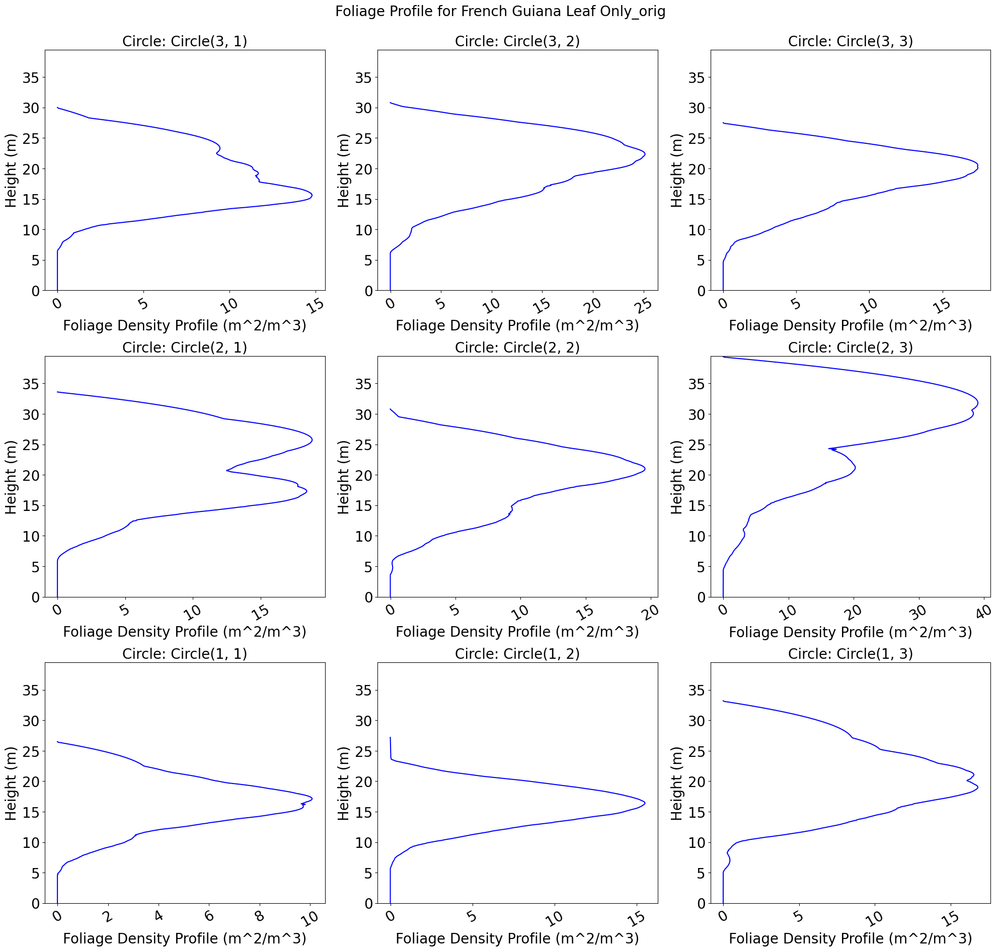

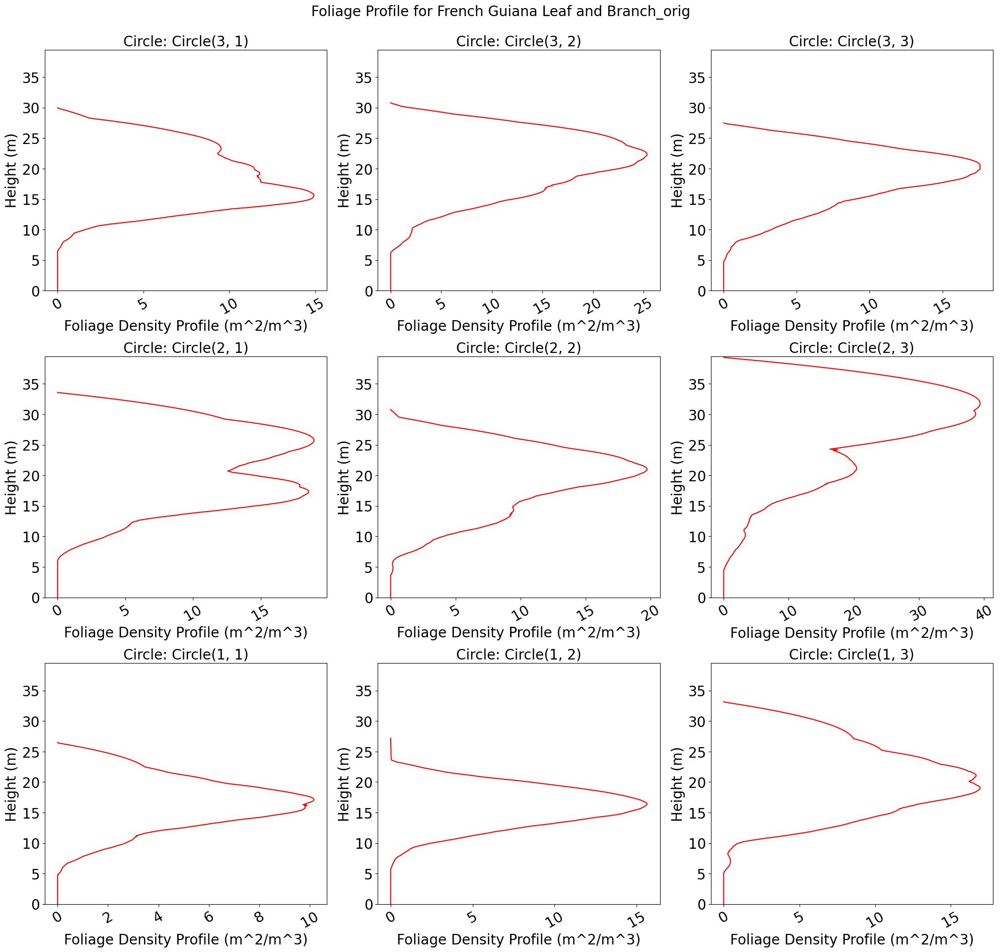

In [54]:
# Plot total leaf only foliage profile per meter for each circle
plot_circle_fp_with_subplots(guiana_circle_objects_leaf_orig, section_range, 'leaf', 'Foliage Profile for French Guiana Leaf Only', fp_file_path, 'guiana', 'orig')

# Plot total leaf and branch foliage profile per meter for each circle
plot_circle_fp_with_subplots(guiana_circle_objects_leaf_orig, section_range, 'veg', 'Foliage Profile for French Guiana Leaf and Branch', fp_file_path, 'guiana', 'orig')

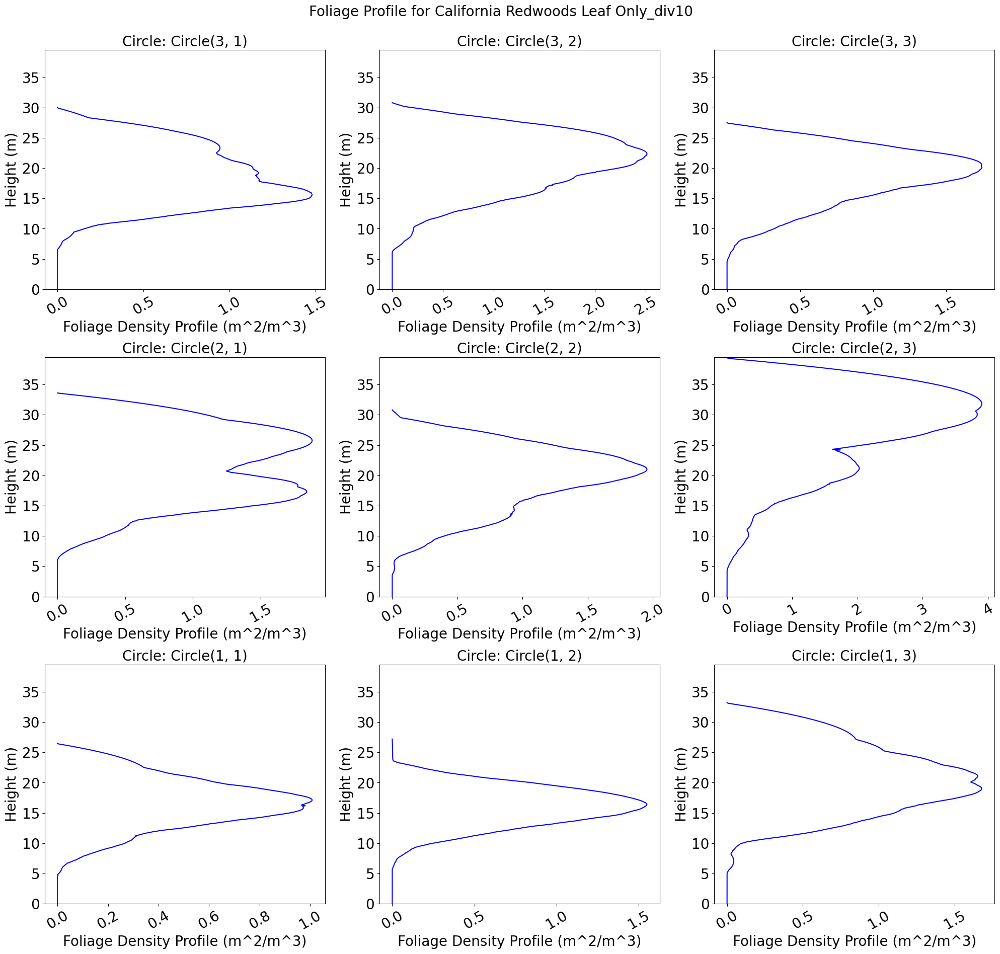

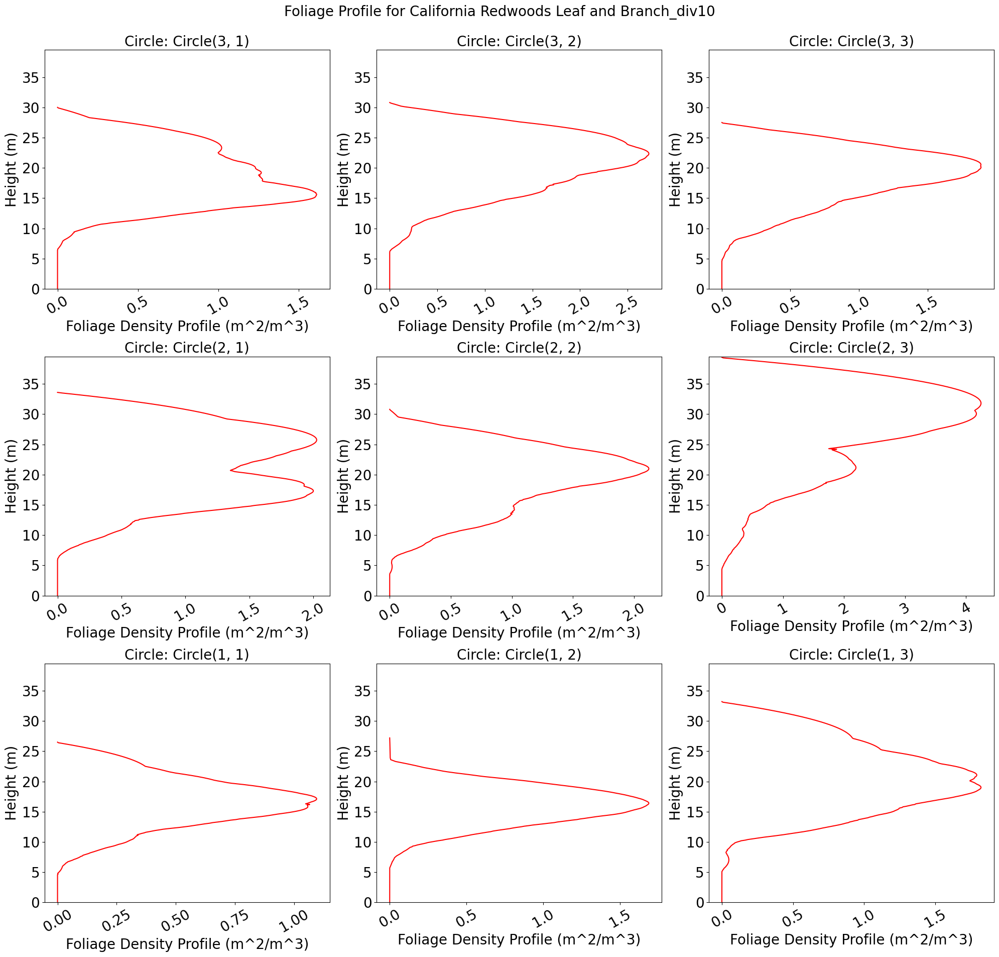

In [55]:
# Plot total leaf only foliage profile per meter for each circle
plot_circle_fp_with_subplots(guiana_circle_objects_leaf_div10, section_range, 'leaf', 'Foliage Profile for California Redwoods Leaf Only', fp_file_path, 'guiana', 'div10')

# Plot total leaf and branch foliage profile per meter for each circle
plot_circle_fp_with_subplots(guiana_circle_objects_leaf_div10, section_range, 'veg', 'Foliage Profile for California Redwoods Leaf and Branch', fp_file_path, 'guiana', 'div10')

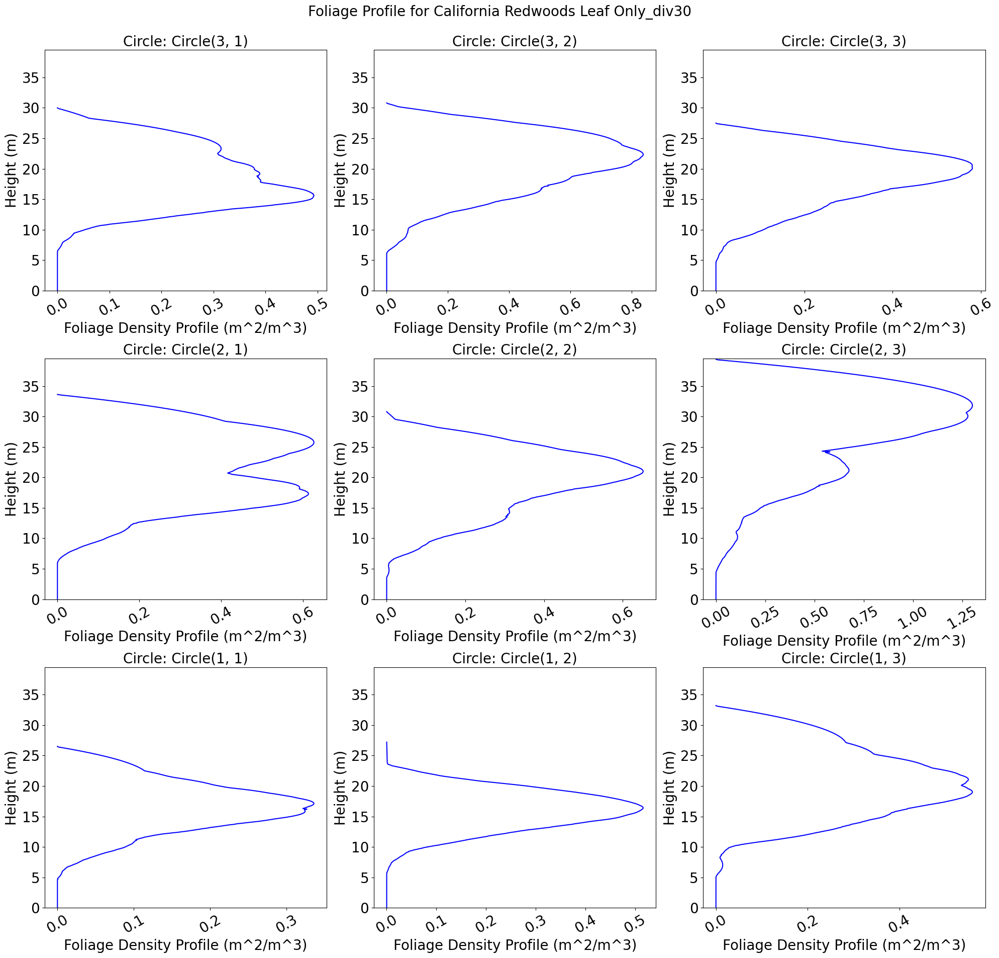

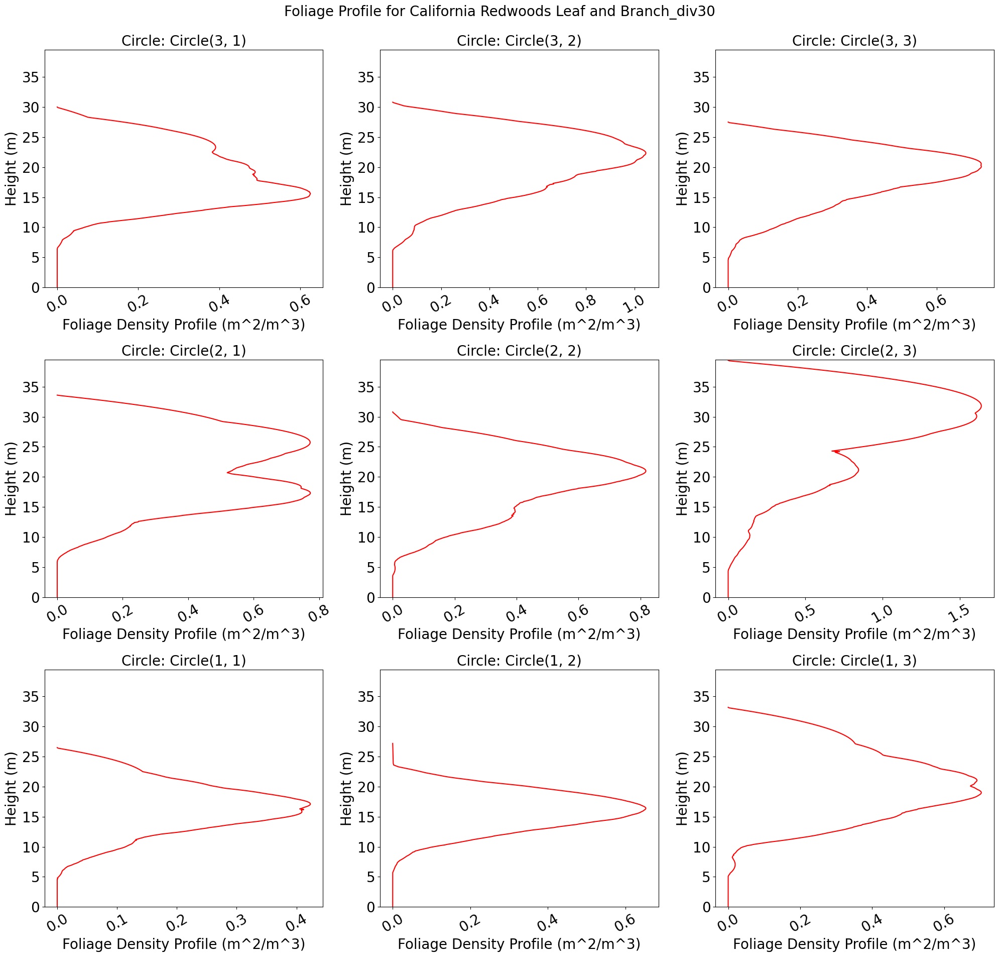

In [56]:
# Plot total leaf only foliage profile per meter for each circle
plot_circle_fp_with_subplots(guiana_circle_objects_leaf_div30, section_range, 'leaf', 'Foliage Profile for California Redwoods Leaf Only', fp_file_path, 'guiana', 'div30')

# Plot total leaf and branch foliage profile per meter for each circle
plot_circle_fp_with_subplots(guiana_circle_objects_leaf_div30, section_range, 'veg', 'Foliage Profile for California Redwoods Leaf and Branch', fp_file_path, 'guiana', 'div30')

In [57]:
def plot_circle_acc_LAI_with_subplots(circle_objects, section_range, data_type, sup_title, path, file_prefix, scale_qualifer):
    plt.rcParams['axes.titlesize'] = 20
    plt.rcParams['axes.labelsize'] = 20
    plt.rcParams['xtick.labelsize'] = 20
    plt.rcParams['ytick.labelsize'] = 20

    os.makedirs(path, exist_ok=True)
    
    fig, axes = plt.subplots(3, 3, figsize=(20, 20))

    for i, (circle, ax) in enumerate(zip(circle_objects, axes.flat)):
        if data_type == 'leaf':
            x_data = circle.acc_LAI_leaf
            y_data = np.arange(len(circle.acc_LAI_leaf)) * section_range

            ax.plot(x_data, y_data, color='blue')
            ax.set_title(circle.circle_name)
            ax.set_xlabel('Accumulated LAI for leaf only')
            ax.set_ylabel('Height (m)')
        elif data_type == 'veg':
            x_data = circle.acc_LAI_branch
            y_data = np.arange(len(circle.acc_LAI_branch)) * section_range

            ax.plot(x_data, y_data, color='red')
            ax.set_title(circle.circle_name)
            if (file_prefix == "redwood"):
                ax.set_xlabel('Accumulated LAI (branch * 0.01 scale)')
            else:
                ax.set_xlabel('Accumulated LAI leaf and branch')
            ax.set_ylabel('Height (m)')
        else:
            print("Invalid data type. Please provide either 'leaf' or 'veg'.")
            return
        
        max_data_length = max(len(circle.acc_LAI_leaf) for circle in circle_objects)
        ax.set_ylim(0, max_data_length * section_range)

        # ax.set_ylim(0, len(circle.total_leaf_area_per_meter_range) * section_range)  # Set y-axis limits
        
        # Rotate x-axis tick labels
        ax.tick_params(axis='x', rotation=30)
    
    fig.suptitle(sup_title + "_" + scale_qualifer, fontsize=20)
    fig.tight_layout(rect=[0, 0.03, 1, 0.98])  # Adjust rect for title position
    
    # Save the figure as PNG with a custom filename
    acc_LAI_path = path + "/acc_LAI/"
    
    if not os.path.exists(acc_LAI_path):
        os.makedirs(acc_LAI_path)

    fig.savefig(f"{acc_LAI_path}{file_prefix}_{scale_qualifer}_{data_type}_acc_LAI.png")

    plt.show()

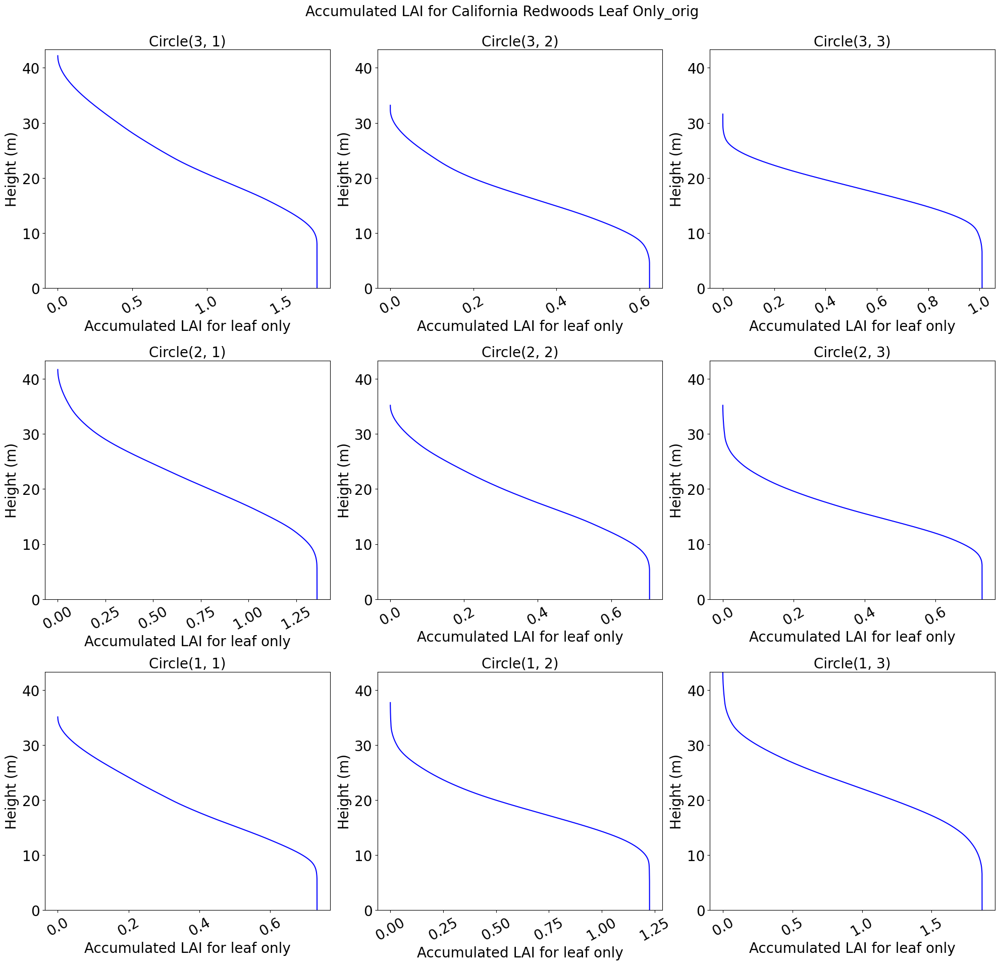

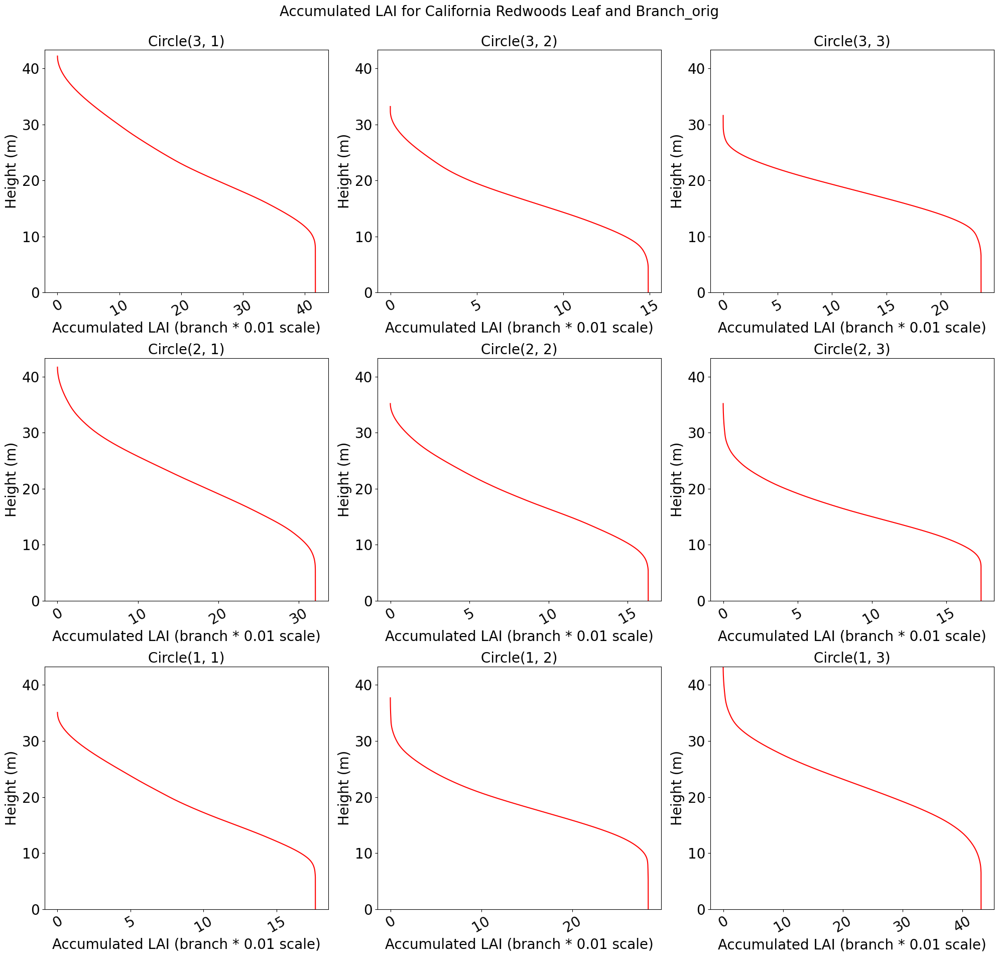

In [58]:
acc_LAI_file_path = os.path.join(output_path, date_subfolder)

plot_circle_acc_LAI_with_subplots(redwood_circle_objects_orig, section_range, 'leaf', 'Accumulated LAI for California Redwoods Leaf Only', acc_LAI_file_path, 'redwood', 'orig')

plot_circle_acc_LAI_with_subplots(redwood_circle_objects_orig, section_range, 'veg', 'Accumulated LAI for California Redwoods Leaf and Branch', acc_LAI_file_path, 'redwood', 'orig')

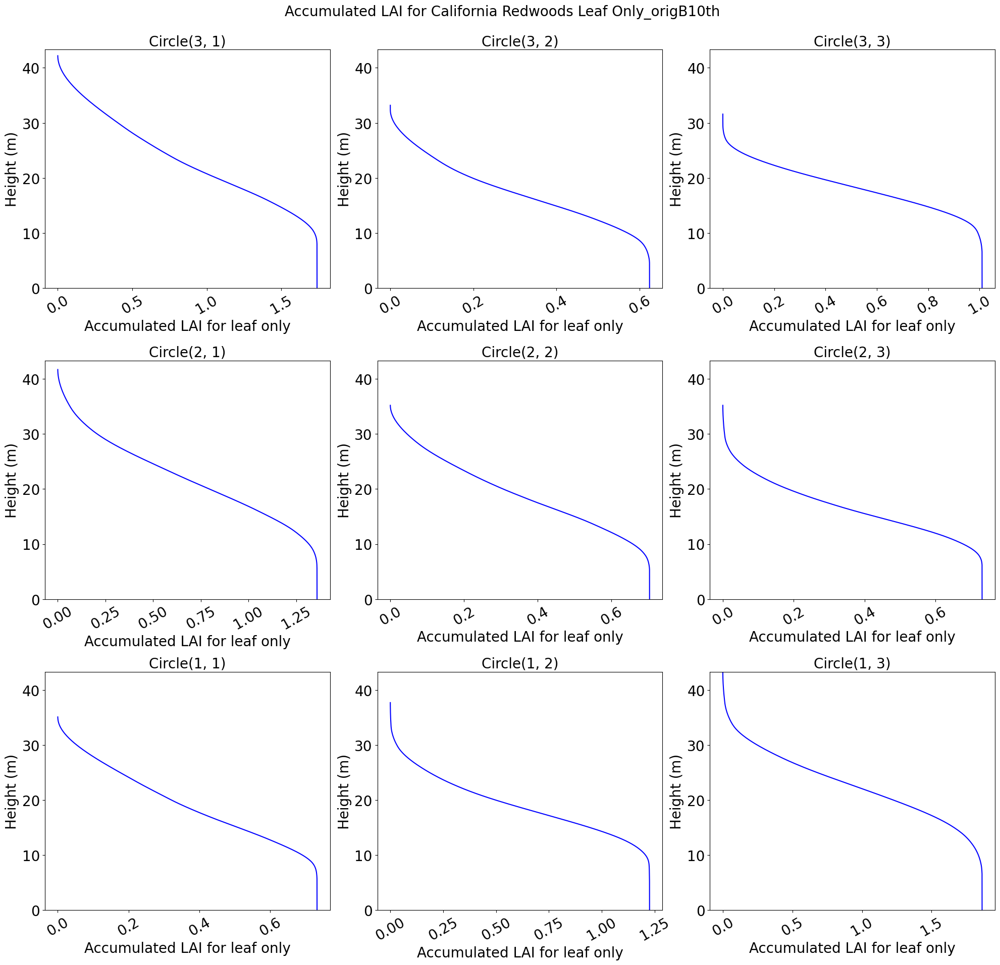

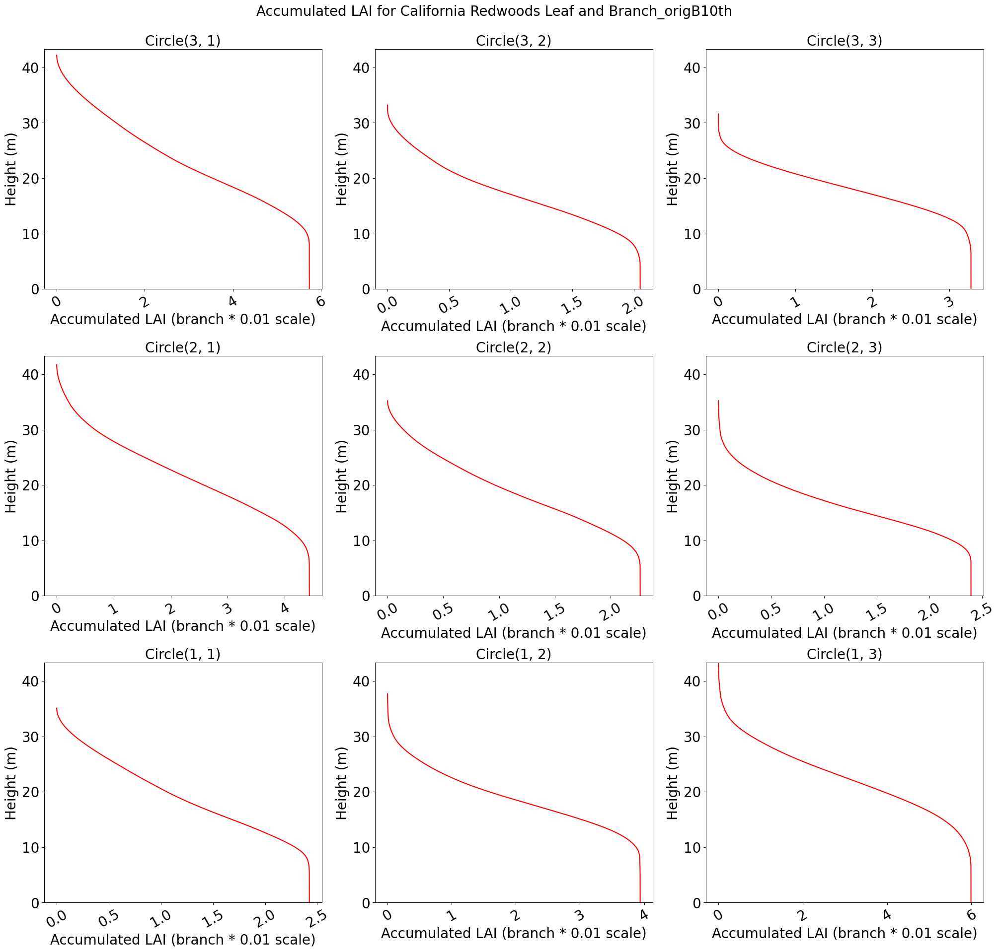

In [59]:
plot_circle_acc_LAI_with_subplots(redwood_circle_objects_branch_origB10th, section_range, 'leaf', 'Accumulated LAI for California Redwoods Leaf Only', acc_LAI_file_path, 'redwood', 'origB10th')

plot_circle_acc_LAI_with_subplots(redwood_circle_objects_branch_origB10th, section_range, 'veg', 'Accumulated LAI for California Redwoods Leaf and Branch', acc_LAI_file_path, 'redwood', 'origB10th')

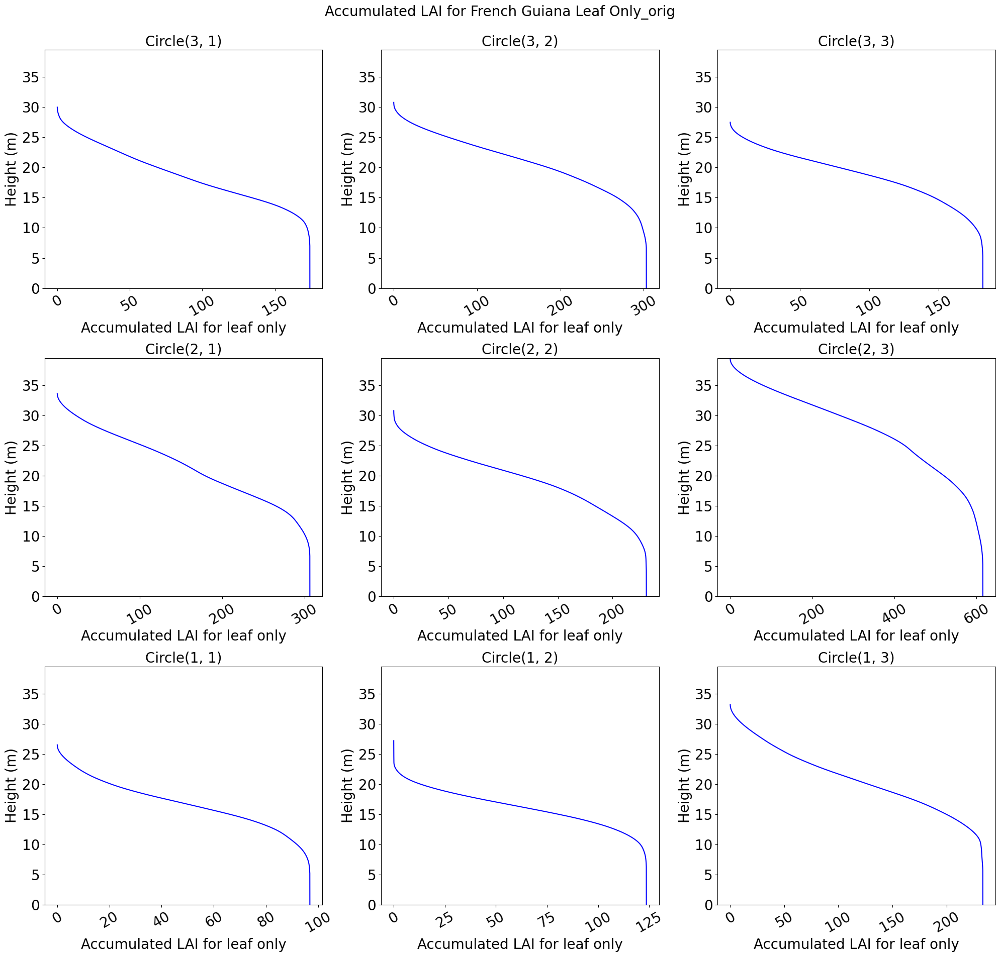

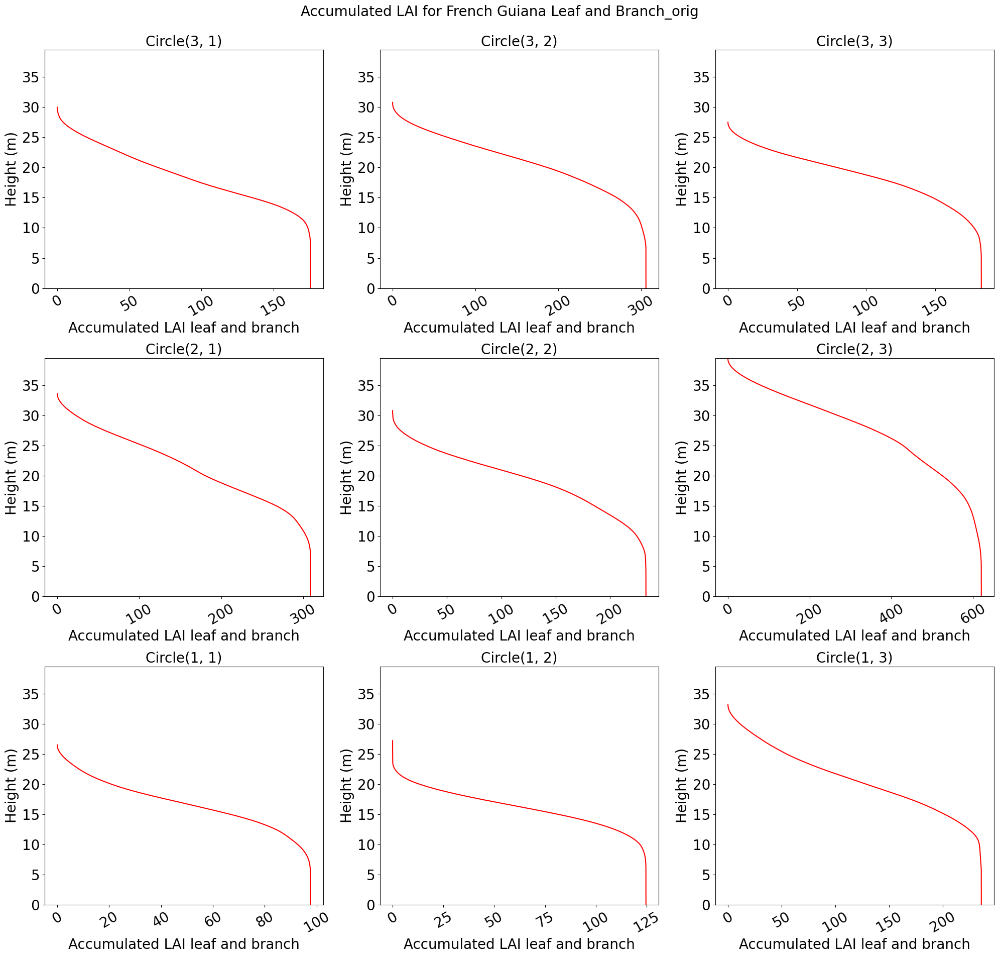

In [60]:
plot_circle_acc_LAI_with_subplots(guiana_circle_objects_leaf_orig, section_range, 'leaf', 'Accumulated LAI for French Guiana Leaf Only', acc_LAI_file_path, 'guiana', 'orig')

plot_circle_acc_LAI_with_subplots(guiana_circle_objects_leaf_orig, section_range, 'veg', 'Accumulated LAI for French Guiana Leaf and Branch', acc_LAI_file_path, 'guiana', 'orig')

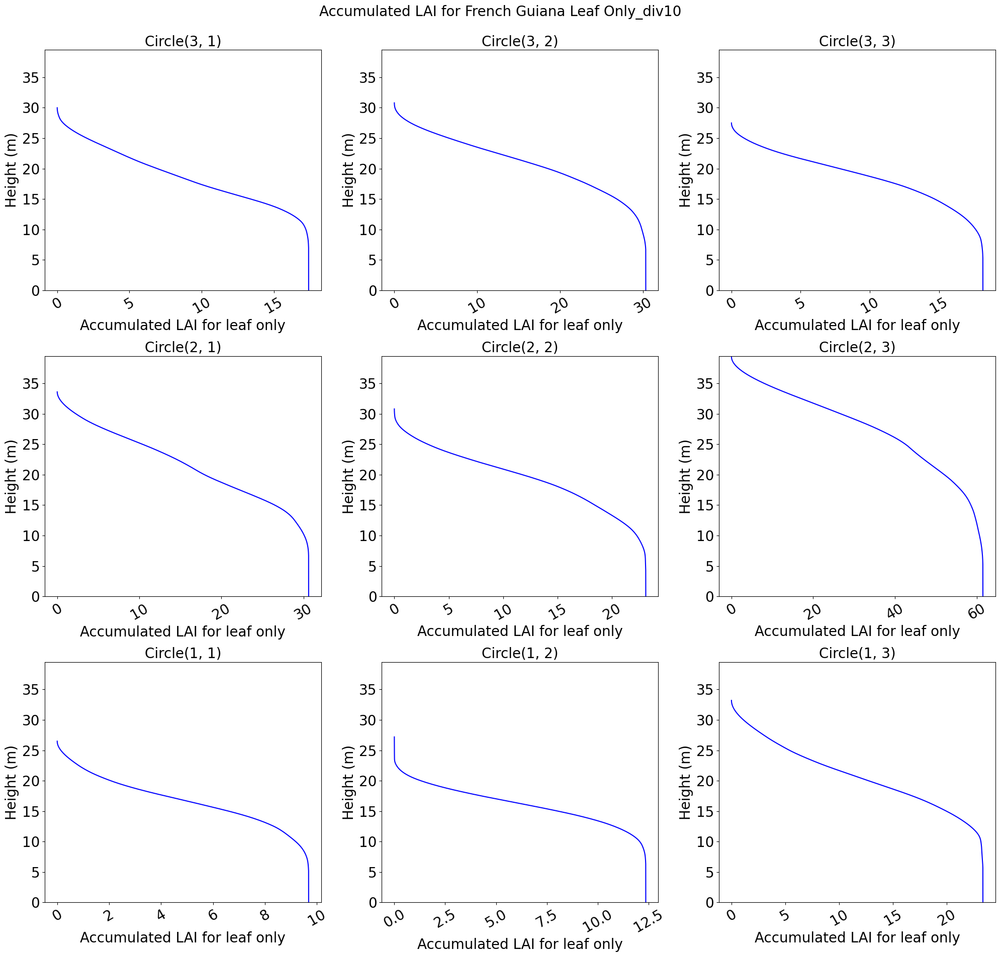

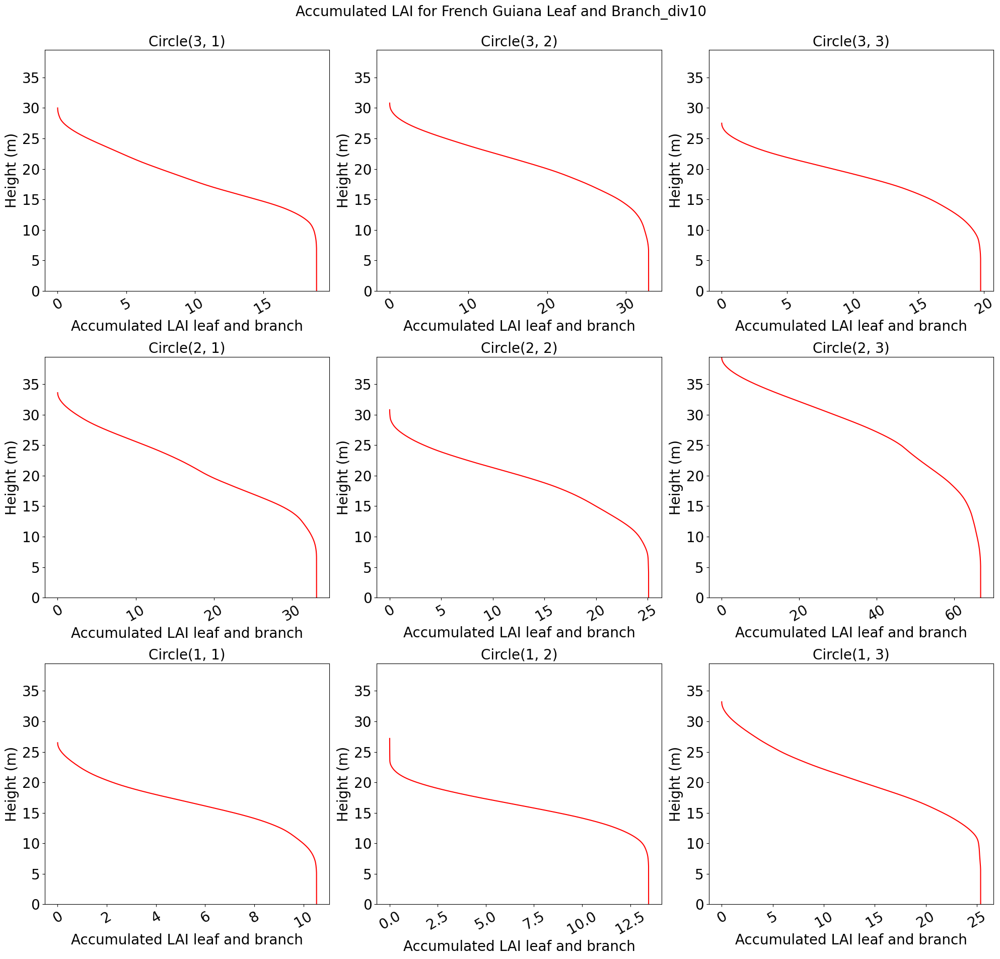

In [61]:
plot_circle_acc_LAI_with_subplots(guiana_circle_objects_leaf_div10, section_range, 'leaf', 'Accumulated LAI for French Guiana Leaf Only', acc_LAI_file_path, 'guiana', 'div10')

plot_circle_acc_LAI_with_subplots(guiana_circle_objects_leaf_div10, section_range, 'veg', 'Accumulated LAI for French Guiana Leaf and Branch', acc_LAI_file_path, 'guiana', 'div10')

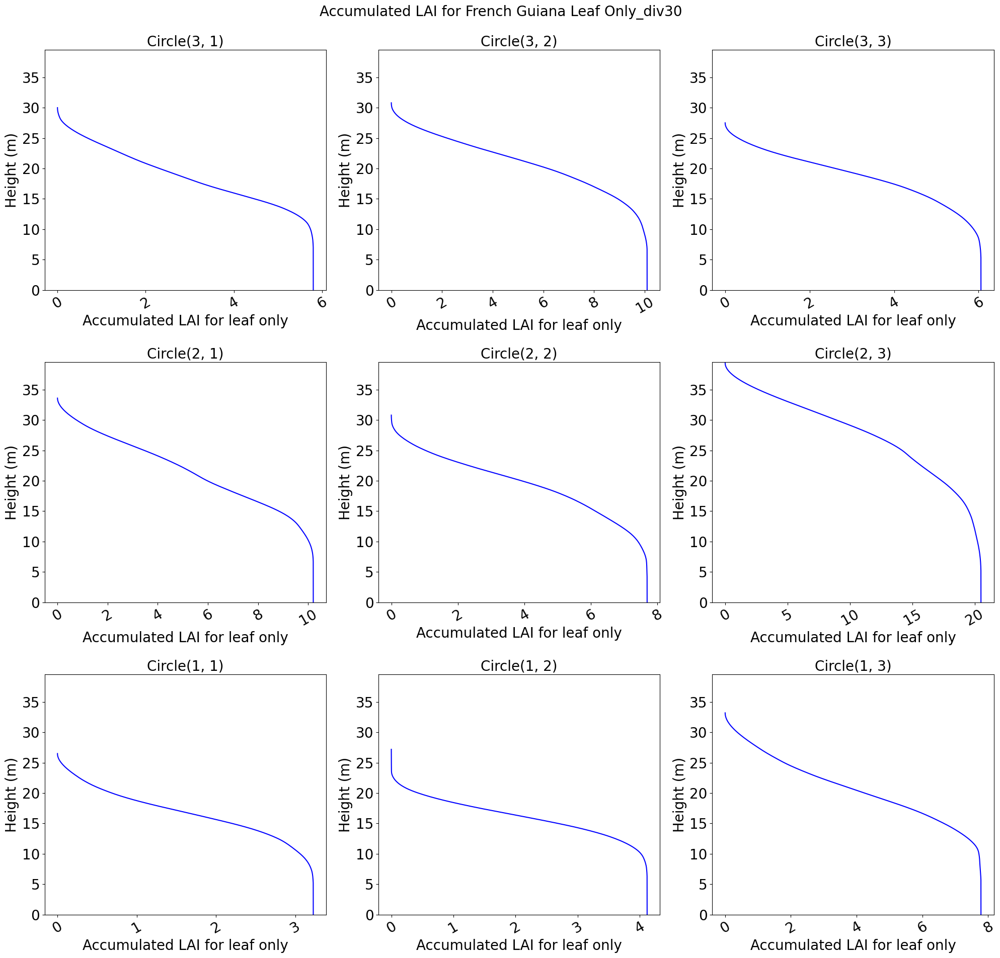

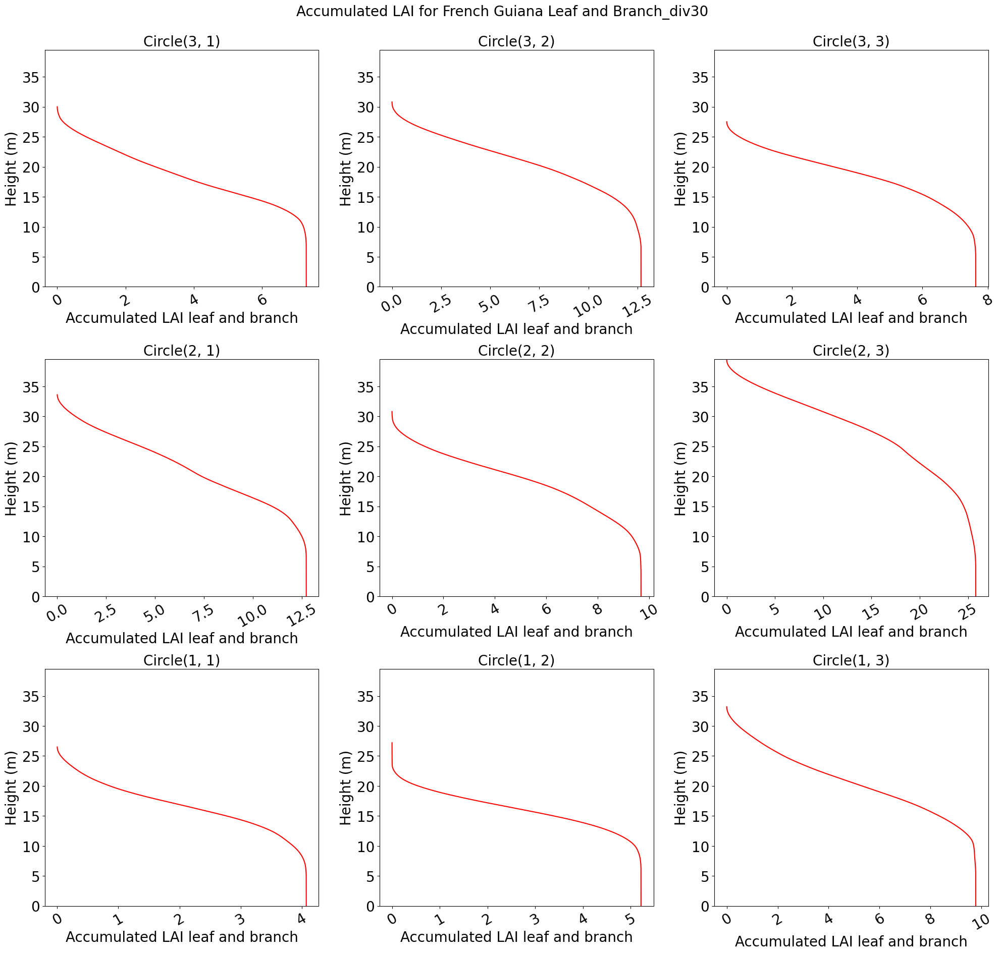

In [62]:
plot_circle_acc_LAI_with_subplots(guiana_circle_objects_leaf_div30, section_range, 'leaf', 'Accumulated LAI for French Guiana Leaf Only', acc_LAI_file_path, 'guiana', 'div30')

plot_circle_acc_LAI_with_subplots(guiana_circle_objects_leaf_div30, section_range, 'veg', 'Accumulated LAI for French Guiana Leaf and Branch', acc_LAI_file_path, 'guiana', 'div30')

In [63]:
# This function creates and returns a list of Circle objects and assigns their name
def create_circle_pgap_data():

    circles_grid = []

    # Check each circle in the 3x3 grid
    for i in range(3, 0, -1):
        for j in range(1, 4):
            
            # Create the circle object with a unique name
            circle_name = f"Circle({i}, {j})"
            circle = lidar_sim_class_declarations.Circle_pgap(circle_name)

            # Assign the row and columns to the circle
            circle.row = i
            circle.column = j

            # Append the circle to the grid list
            circles_grid.append(circle)

    return circles_grid

def calc_gap_prob(circle_objects, type):

    df_list = []

    for circle in circle_objects:
        # if (type == "leaf"):
        #     new_Fa = circle.total_Fa
        # elif (type == "branch"):
        #     new_Fa = circle.total_Fa_b
        if (type == "leaf"):
            acc_LAI = circle.acc_LAI_leaf
        elif (type == "branch"):
            acc_LAI = circle.acc_LAI_branch
        else:
            raise ValueError("Invalid type. Supported types are 'leaf' and 'branch'.")
    
        df = pd.DataFrame()
        meter_range = circle.tree_height_array
        gap_prob = np.exp(-acc_LAI / 2)
        waveform = np.zeros_like(gap_prob)

        for i in range(len(gap_prob)):
            if i == 0:  # First element
                waveform[i] = (gap_prob[i]) / (section_range)
            elif i == len(gap_prob) - 1:  # Last element
                waveform[i] = (gap_prob[i] - gap_prob[i - 1]) / (section_range * 2)
            else:  # All other elements
                waveform[i] = (gap_prob[i + 1] - gap_prob[i - 1]) / (section_range * 2)

        if (type == "leaf"):
            circle.gap_prob = gap_prob
            circle.waveform = waveform
            Fa = circle.Fa_array[0]
        elif (type == "branch"):
            circle.gap_prob_b = gap_prob
            circle.waveform_b = waveform
            Fa = circle.Fa_b_array[0]

        print(circle.circle_name)
        print(acc_LAI)
        print(gap_prob)
        # print(waveform)

        df['Height z'] = meter_range
        df['accLAI'] = acc_LAI
        df['P'] = gap_prob
        df['Fa'] = Fa
        df['Circle Name'] = circle.circle_name

        df = df[['Circle Name', 'Height z', 'Fa', 'accLAI', 'P']]

        print(df['Fa'])
        print(df['Circle Name'])

        df_list.append(df)
    
    return df_list

def output_saveCSV(sitename, df_list, path, scale_qualifier):
    combined_df = pd.DataFrame()
    placeholder_df = pd.DataFrame({'': [''] * len(df_list[0])})  # Create placeholder DataFrame with empty values
    

    for df in df_list:
        # Convert all columns to float except 'Height z'
        for col in df.columns:
            if col not in ['Height z', 'Circle Name']:
                df[col] = df[col].astype(float)
                df[col] = df[col].map('{:.12f}'.format)
        reversed_df = df.iloc[::-1].reset_index(drop=True)
        combined_df = pd.concat([combined_df, placeholder_df, reversed_df], axis=1)
        print(df)

    pgap_path = path + "/gap_probability/"

    if not os.path.exists(pgap_path):
        os.makedirs(pgap_path)

    combined_df.to_csv(f'{pgap_path}{sitename}_{scale_qualifier}_gp.csv', index=False)

def plot_gap_probability(df_list, sitename, circle_names, path, scale_qualifier):
    num_rows = 3
    num_cols = 3

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(24, 24))

    # Determine line color based on sitename
    if "leaf" in sitename.lower():
        line_color = 'blue'
    elif "veg" in sitename.lower():
        line_color = 'red'

    for i, (df, circle_name) in enumerate(zip(df_list, circle_names)):
        row = i // num_cols
        col = i % num_cols

        ax = axs[row, col]
        ax.plot(df['P'].astype(float), df['Height z'].astype(float), color=line_color)
        ax.set_xlabel('Total Gap Probability (P)')
        ax.set_ylabel('Height z')
        ax.set_title(circle_name)
        ax.tick_params(axis='x', rotation=45)  # Rotate x-axis labels

    plt.suptitle(f'Total Gap Probability vs Height for {sitename}_{scale_qualifier}', fontsize=24)
    plt.tight_layout(rect=[0, 0.03, 1, 0.98])  # Adjust the top parameter here

    # Save the figure to a PNG file
    pgap_path = path + "/gap_probability/"

    if not os.path.exists(pgap_path):
        os.makedirs(pgap_path)

    plt.savefig(f'{pgap_path}{sitename}_{scale_qualifier}_gp.png', bbox_inches='tight')
    plt.show()

In [64]:
# redwood_circle_pgap_objects = create_circle_pgap_data()
# guiana_circle_pgap_objects = create_circle_pgap_data()

pgap_path = os.path.join(output_path, date_subfolder)

redwood_leaf_pgap_orig_df_list = calc_gap_prob(redwood_circle_objects_orig, "leaf")
redwood_branch_pgap_orig_df_list = calc_gap_prob(redwood_circle_objects_orig, "branch")
redwood_leaf_pgap_branch_origB10th_df_list = calc_gap_prob(redwood_circle_objects_branch_origB10th, "leaf")
redwood_branch_pgap_branch_origB10th_df_list = calc_gap_prob(redwood_circle_objects_branch_origB10th, "branch")

guiana_leaf_pgap_orig_df_list = calc_gap_prob(guiana_circle_objects_leaf_orig, "leaf")
guiana_branch_pgap_orig_df_list = calc_gap_prob(guiana_circle_objects_leaf_orig, "branch")
guiana_leaf_pgap_div10_df_list = calc_gap_prob(guiana_circle_objects_leaf_div10, "leaf")
guiana_branch_pgap_div10_df_list = calc_gap_prob(guiana_circle_objects_leaf_div10, "branch")
guiana_leaf_pgap_div30_df_list = calc_gap_prob(guiana_circle_objects_leaf_div30, "leaf")
guiana_branch_pgap_div30_df_list = calc_gap_prob(guiana_circle_objects_leaf_div30, "branch")

output_saveCSV("redwood_leaf", redwood_leaf_pgap_orig_df_list, pgap_path, "orig")
output_saveCSV("redwood_veg", redwood_branch_pgap_orig_df_list, pgap_path, "orig")
output_saveCSV("redwood_leaf", redwood_leaf_pgap_branch_origB10th_df_list, pgap_path, "origB10th")
output_saveCSV("redwood_veg", redwood_branch_pgap_branch_origB10th_df_list, pgap_path, "origB10th")

output_saveCSV("guiana_leaf", guiana_leaf_pgap_orig_df_list, pgap_path, "orig")
output_saveCSV("guiana_veg", guiana_branch_pgap_orig_df_list, pgap_path, "orig")
output_saveCSV("guiana_leaf", guiana_leaf_pgap_div10_df_list, pgap_path, "div10")
output_saveCSV("guiana_veg", guiana_branch_pgap_div10_df_list, pgap_path, "div10")
output_saveCSV("guiana_leaf", guiana_leaf_pgap_div30_df_list, pgap_path, "div30")
output_saveCSV("guiana_veg", guiana_branch_pgap_div30_df_list, pgap_path, "div30")

Circle(3, 1)
[1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746
 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746
 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746
 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746
 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746
 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746
 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746
 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746
 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746
 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746
 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746
 1.73993746 1.73993746 1.73993746 1.73993746 1.73993746 1.73993681
 1.73993501 1.73993081 1.73992424 1.73990349 1.73989207 1.73985651
 1.73980681 1.73972353 1.73960721 1.73945838 1.73925707 1.73904482
 1.73878138 1.73846274 1.7380767  1.73765479 1.73

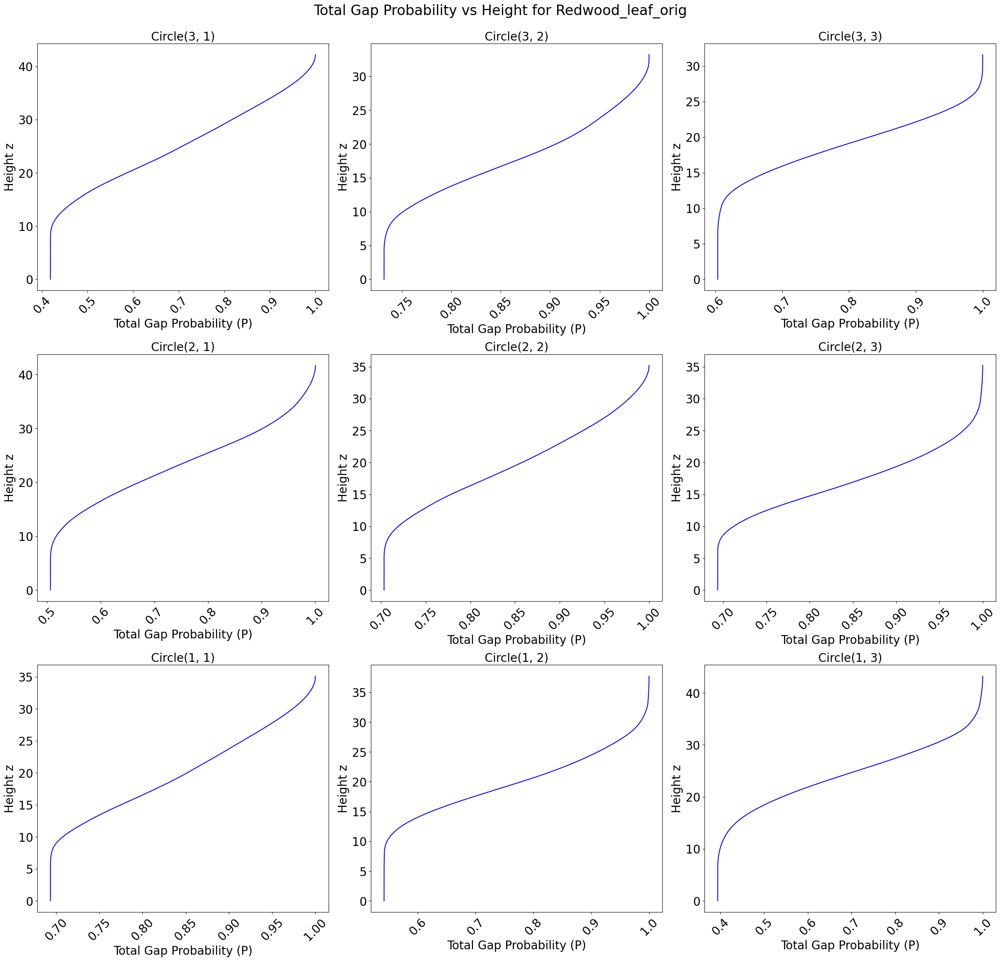

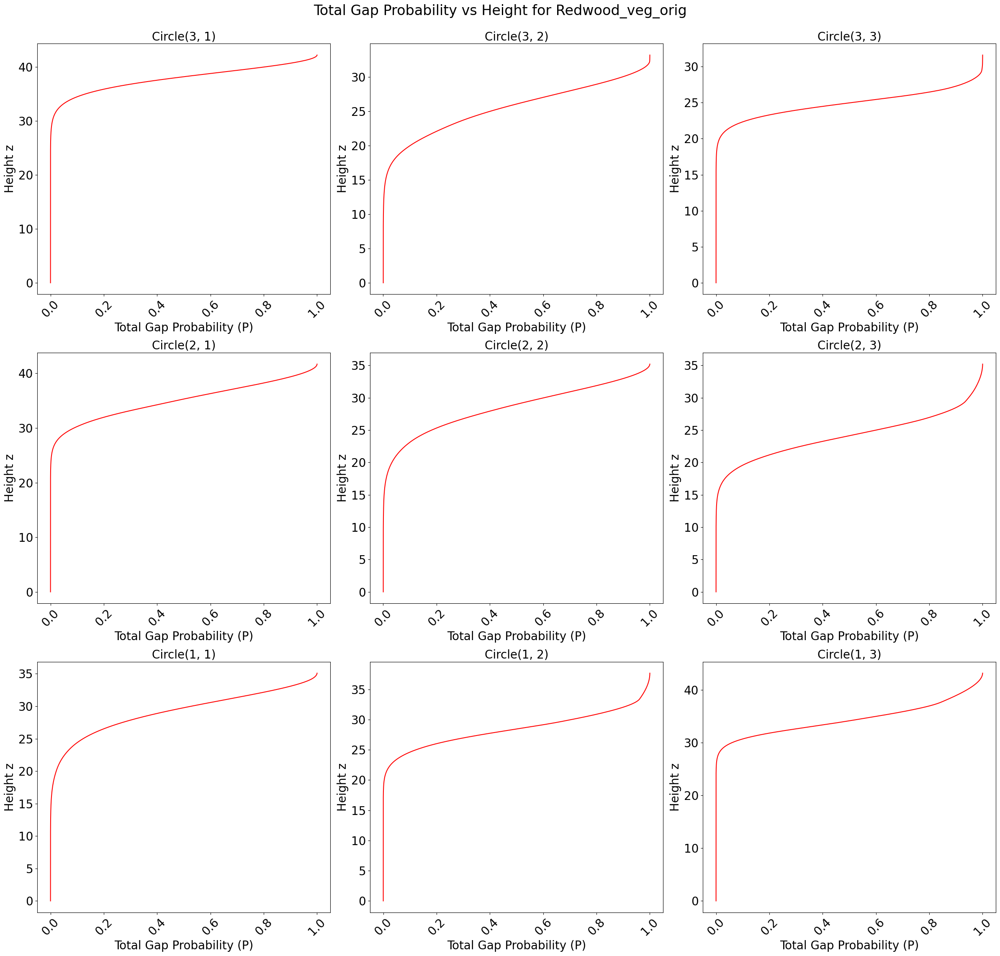

In [65]:
circle_names = [circle.circle_name for circle in redwood_circle_objects_orig]

plot_gap_probability(redwood_leaf_pgap_orig_df_list, "Redwood_leaf", circle_names, pgap_path, "orig")
plot_gap_probability(redwood_branch_pgap_orig_df_list, "Redwood_veg", circle_names, pgap_path, "orig")

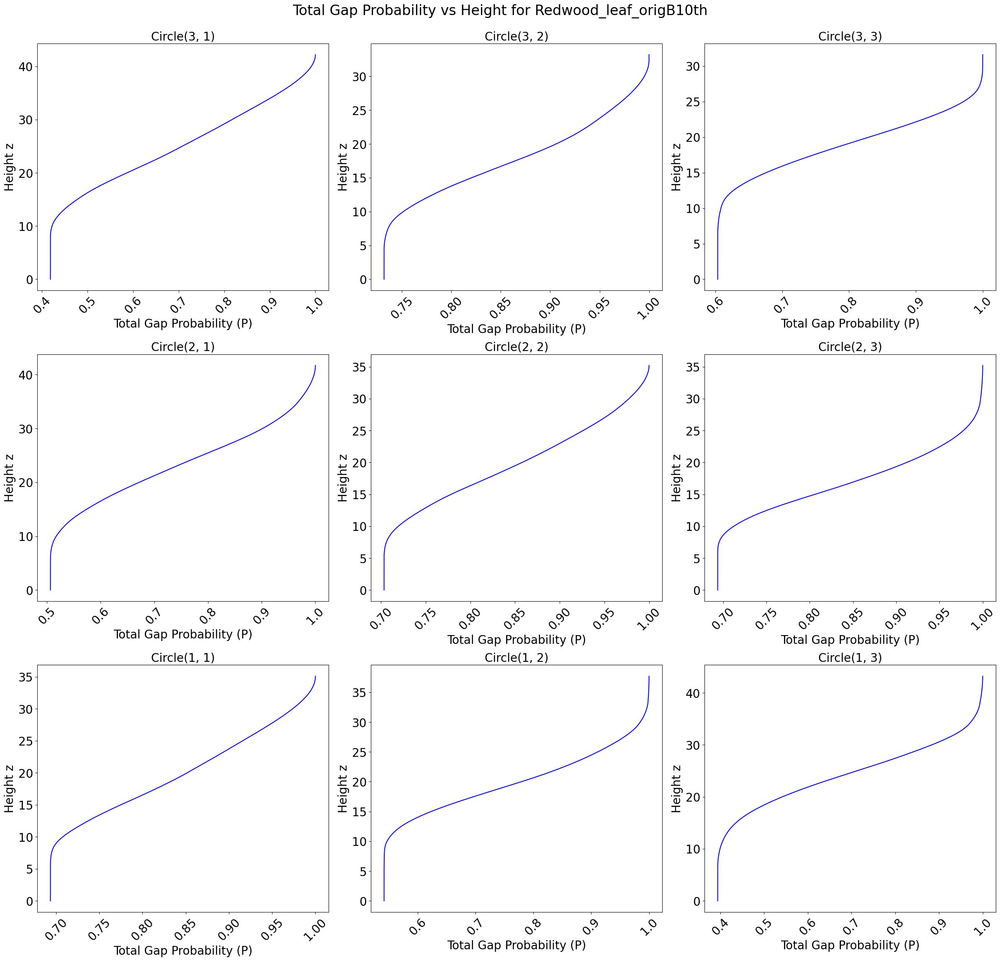

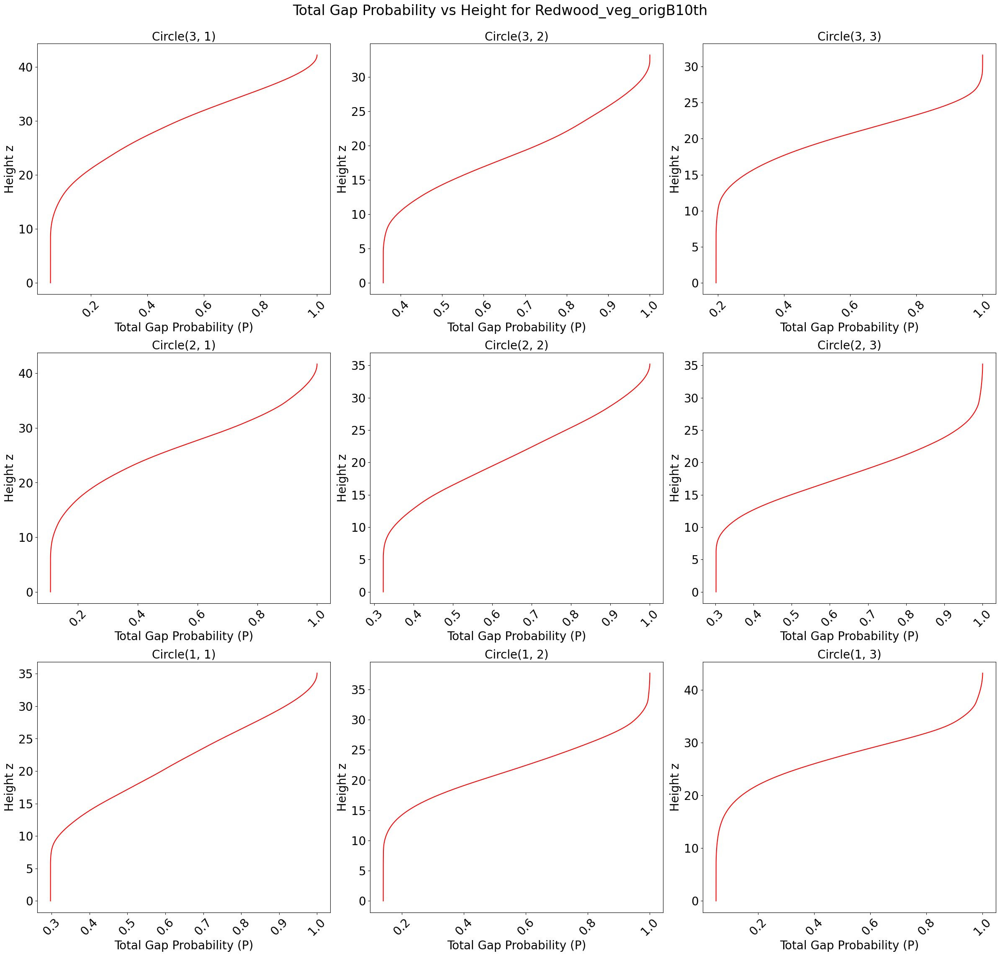

In [66]:
plot_gap_probability(redwood_leaf_pgap_branch_origB10th_df_list, "Redwood_leaf", circle_names, pgap_path, "origB10th")
plot_gap_probability(redwood_branch_pgap_branch_origB10th_df_list, "Redwood_veg", circle_names, pgap_path, "origB10th")

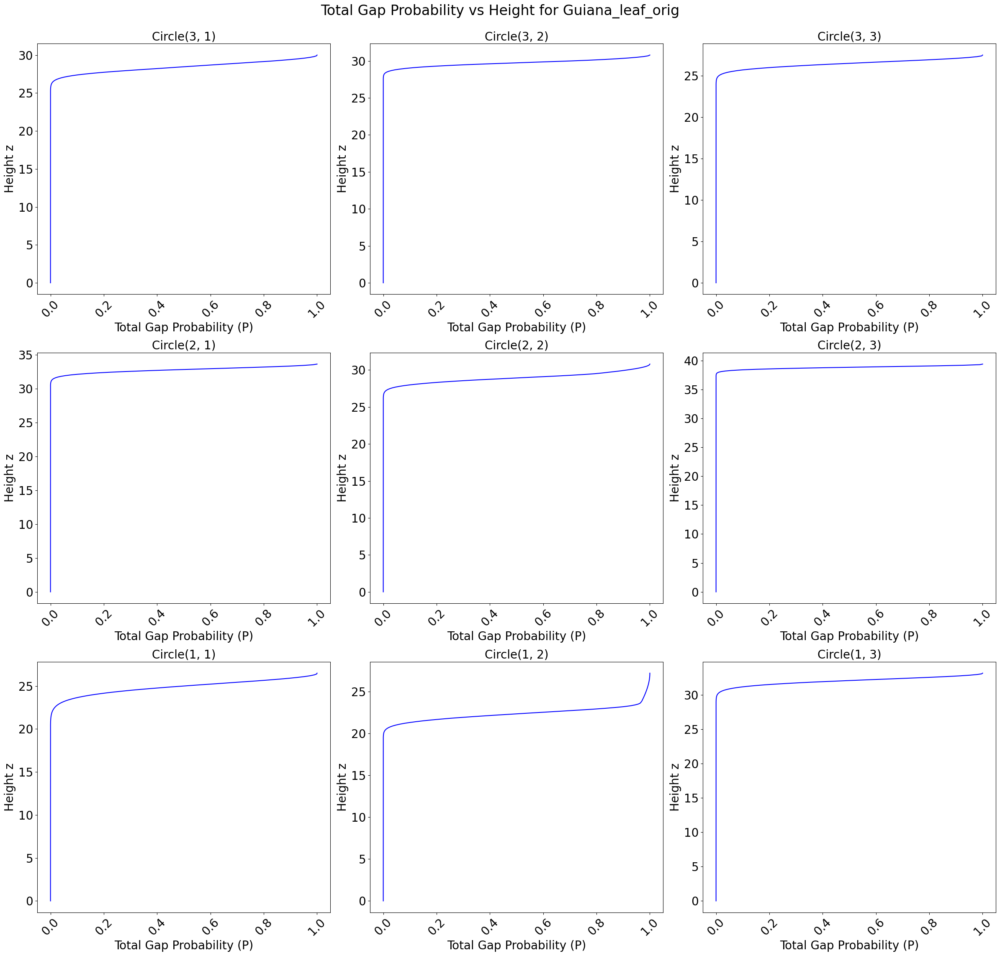

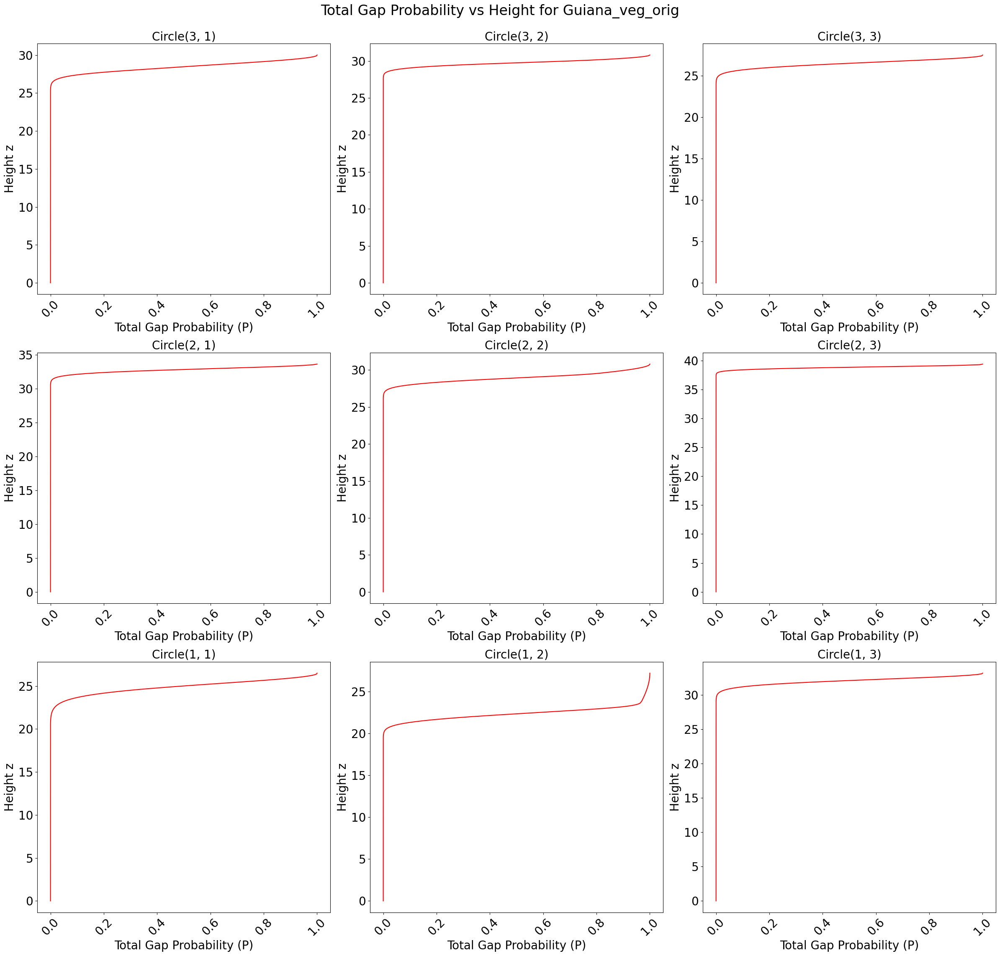

In [67]:
plot_gap_probability(guiana_leaf_pgap_orig_df_list, "Guiana_leaf", circle_names, pgap_path, "orig")
plot_gap_probability(guiana_branch_pgap_orig_df_list, "Guiana_veg", circle_names, pgap_path, "orig")

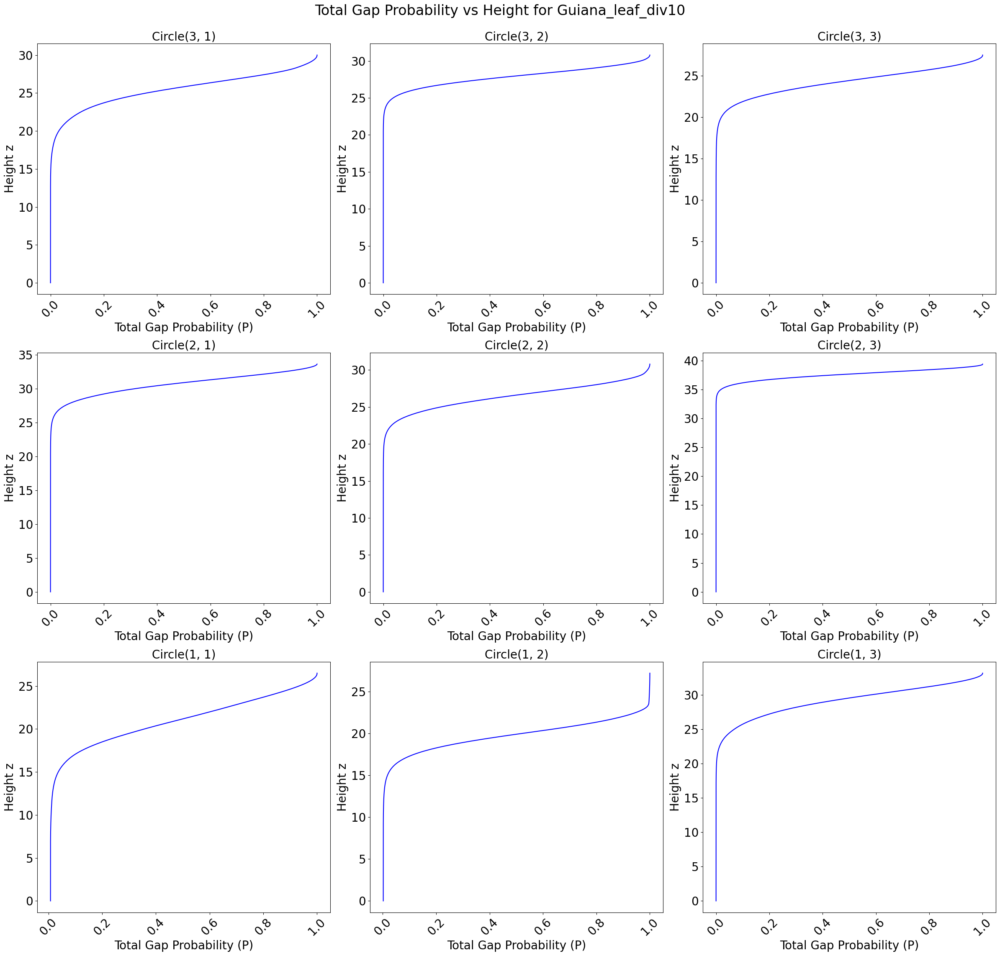

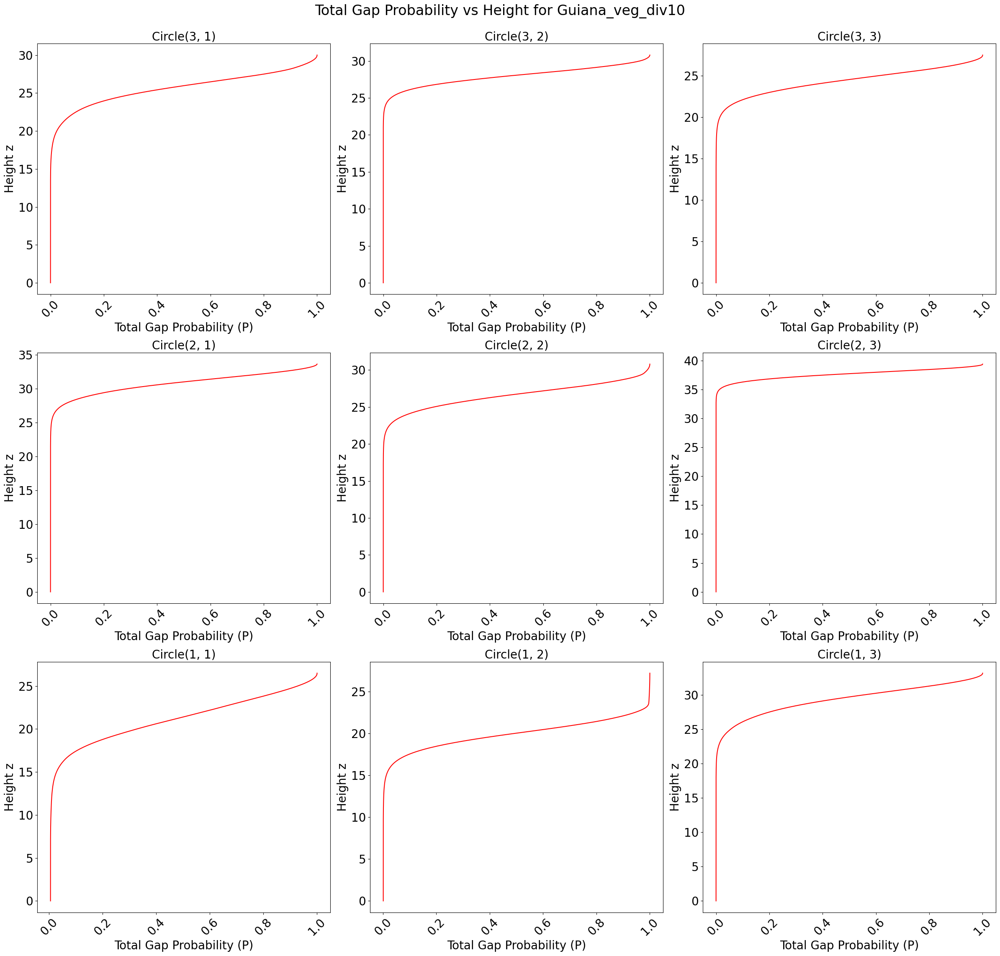

In [68]:

plot_gap_probability(guiana_leaf_pgap_div10_df_list, "Guiana_leaf", circle_names, pgap_path, "div10")
plot_gap_probability(guiana_branch_pgap_div10_df_list, "Guiana_veg", circle_names, pgap_path, "div10")

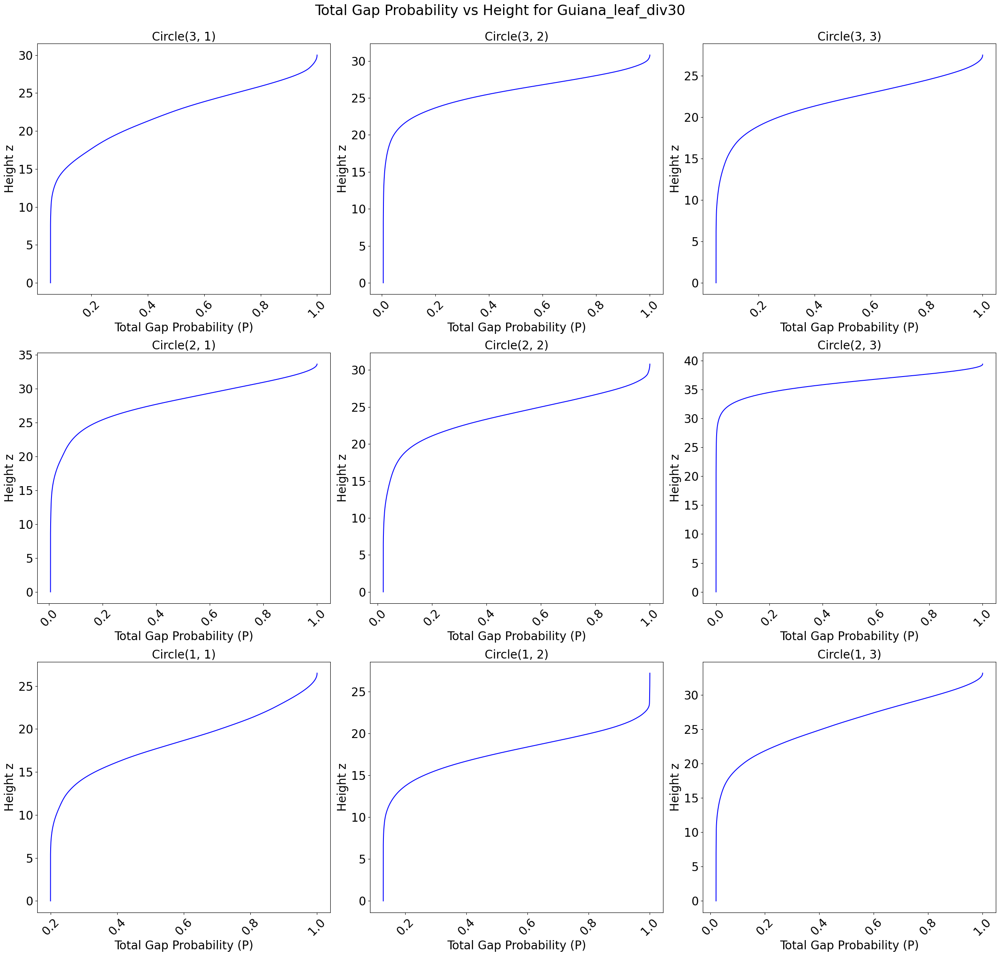

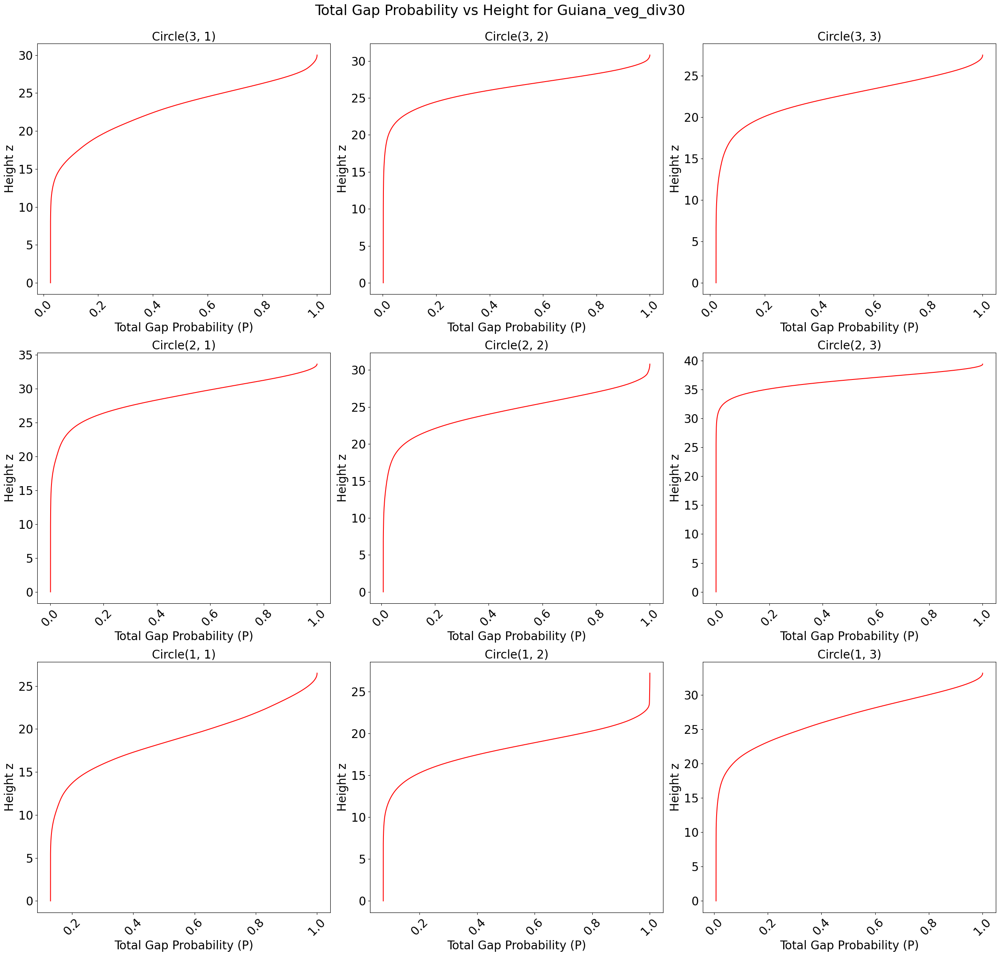

In [69]:
plot_gap_probability(guiana_leaf_pgap_div30_df_list, "Guiana_leaf", circle_names, pgap_path, "div30")
plot_gap_probability(guiana_branch_pgap_div30_df_list, "Guiana_veg", circle_names, pgap_path, "div30")

In [70]:
save_objects_to_file(redwood_tree_objects_branch_orig, "redwood_tree_objects_branch_orig.pkl", subfolder="object_data")
save_objects_to_file(redwood_tree_objects_branch_origB10th, "redwood_tree_objects_branch_origB10th.pkl", subfolder="object_data")
save_objects_to_file(guiana_tree_objects_leaf_orig, "guiana_tree_objects_leaf_orig.pkl", subfolder="object_data")
save_objects_to_file(guiana_tree_objects_leaf_div10, "guiana_tree_objects_leaf_div10.pkl", subfolder="object_data")
save_objects_to_file(guiana_tree_objects_leaf_div30, "guiana_tree_objects_leaf_div30.pkl", subfolder="object_data")
save_objects_to_file(redwood_circle_objects_orig, "redwood_circle_objects_orig.pkl", subfolder="object_data")
save_objects_to_file(redwood_circle_objects_branch_origB10th, "redwood_circle_objects_origB10th.pkl", subfolder="object_data")
save_objects_to_file(guiana_circle_objects_leaf_orig, "guiana_circle_objects_leaf_orig.pkl", subfolder="object_data")
save_objects_to_file(guiana_circle_objects_leaf_div10, "guiana_circle_objects_leaf_div10.pkl", subfolder="object_data")
save_objects_to_file(guiana_circle_objects_leaf_div30, "guiana_circle_objects_leaf_div30.pkl", subfolder="object_data")

In [71]:
for circle in guiana_circle_objects_leaf_div30:
    if circle.circle_name == "Circle(2, 3)":
        print(f"French Guiana: {circle.circle_name}\n")
        ratio_list = []
        for i, tree_index in enumerate(circle.tree_indices):
            print(f"{i + 1}. Tree {tree_index}:")
            each_tree_array = circle.Li_dz_branch[i]
            pixel_area = circle.pixel_area
            print(f"Pixel Area: {pixel_area}")
            dL_dz_per_tree = np.sum(each_tree_array)
            print(f"dL_dz_sum_per_tree: {dL_dz_per_tree}")
            print(f"dL_dz/pixel_area = {dL_dz_per_tree}/{pixel_area} = {dL_dz_per_tree/pixel_area}")
            dL_dz_per_tree_pixel_ratio = dL_dz_per_tree/pixel_area
            ratio_list.append(dL_dz_per_tree_pixel_ratio)
            print()
        
        print(ratio_list)
        print(circle.acc_LAI_leaf)

French Guiana: Circle(2, 3)

1. Tree 179:
Pixel Area: 870.9201694097964
dL_dz_sum_per_tree: 214.52242638875745
dL_dz/pixel_area = 214.52242638875745/870.9201694097964 = 0.24631698050366044

2. Tree 198:
Pixel Area: 870.9201694097964
dL_dz_sum_per_tree: 218.6441978607623
dL_dz/pixel_area = 218.6441978607623/870.9201694097964 = 0.251049643285828

3. Tree 226:
Pixel Area: 870.9201694097964
dL_dz_sum_per_tree: 1355.0380737525916
dL_dz/pixel_area = 1355.0380737525916/870.9201694097964 = 1.5558694371160005

4. Tree 249:
Pixel Area: 870.9201694097964
dL_dz_sum_per_tree: 1468.0747312942572
dL_dz/pixel_area = 1468.0747312942572/870.9201694097964 = 1.6856593553105326

5. Tree 296:
Pixel Area: 870.9201694097964
dL_dz_sum_per_tree: 3358.6936961366373
dL_dz/pixel_area = 3358.6936961366373/870.9201694097964 = 3.856488590007912

6. Tree 311:
Pixel Area: 870.9201694097964
dL_dz_sum_per_tree: 462.10851448856806
dL_dz/pixel_area = 462.10851448856806/870.9201694097964 = 0.530598016580244

7. Tree 315:
Pi

In [72]:
def get_total_LAI(circle_objects, path, site, type, scale_qualifier):
    circle_names = [circle.circle_name for circle in circle_objects]
    crown_volumes = [np.sum(circle.crown_vol_in_circle) for circle in circle_objects]
    pixel_area = np.array([circle.pixel_area for circle in circle_objects])

    if(type == "leaf"):
        circle_Fa = np.array([circle.new_Fa for circle in circle_objects])
    if(type == "veg"):
        circle_Fa = np.array([circle.Fa_b for circle in circle_objects])

    total_LAI = (crown_volumes*circle_Fa)/pixel_area

    total_LAI_df = pd.DataFrame()

    total_LAI_df['circle_names'] = circle_names
    total_LAI_df['crown_volumes'] = crown_volumes
    total_LAI_df['circle_Fa'] = circle_Fa
    total_LAI_df['pixel_area'] = pixel_area
    total_LAI_df['total_LAI'] = total_LAI

    if not os.path.exists(path):
        os.makedirs(path)

    filename = f'{site}_{scale_qualifier}_{type}_totalLAI.csv'

    total_LAI_df.to_csv(f'{path}/{filename}', index=False)
    print(f'wrote to: {path}/{filename}')

    return total_LAI_df

acc_LAI_csv_path = os.path.join(output_path, date_subfolder, "acc_LAI")

redwood_total_LAI_leaf_df_orig = get_total_LAI(redwood_circle_objects_orig, acc_LAI_csv_path, "redwood", "leaf", "orig")
redwood_total_LAI_veg_df_orig = get_total_LAI(redwood_circle_objects_orig, acc_LAI_csv_path, "redwood", "veg", "orig")
redwood_total_LAI_leaf_df_branch_origB10th = get_total_LAI(redwood_circle_objects_branch_origB10th, acc_LAI_csv_path, "redwood", "leaf", "origB10th")
redwood_total_LAI_veg_df_branch_origB10th = get_total_LAI(redwood_circle_objects_branch_origB10th, acc_LAI_csv_path, "redwood", "veg", "origB10th")

guiana_total_LAI_leaf_df_orig = get_total_LAI(guiana_circle_objects_leaf_orig, acc_LAI_csv_path, "guiana", "leaf", "orig")
guiana_total_LAI_veg_df_orig = get_total_LAI(guiana_circle_objects_leaf_orig, acc_LAI_csv_path , "guiana", "veg", "orig")
guiana_total_LAI_leaf_df_div10 = get_total_LAI(guiana_circle_objects_leaf_div10, acc_LAI_csv_path, "guiana", "leaf", "div10")
guiana_total_LAI_veg_df_div10 = get_total_LAI(guiana_circle_objects_leaf_div10, acc_LAI_csv_path, "guiana", "veg", "div10")
guiana_total_LAI_leaf_df_div30 = get_total_LAI(guiana_circle_objects_leaf_div30, acc_LAI_csv_path, "guiana", "leaf", "div30")
guiana_total_LAI_veg_df_div30 = get_total_LAI(guiana_circle_objects_leaf_div30, acc_LAI_csv_path, "guiana", "veg", "div30")

wrote to: C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/output_008/2024_10_16\acc_LAI/redwood_orig_leaf_totalLAI.csv
wrote to: C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/output_008/2024_10_16\acc_LAI/redwood_orig_veg_totalLAI.csv
wrote to: C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/output_008/2024_10_16\acc_LAI/redwood_origB10th_leaf_totalLAI.csv
wrote to: C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/output_008/2024_10_16\acc_LAI/redwood_origB10th_veg_totalLAI.csv
wrote to: C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/output_008/2024_10_16\acc_LAI/guiana_orig_leaf_totalLAI.csv
wrote to: C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/output_008/2024_10_16\acc_LAI/guiana_orig_veg_totalLAI.csv
wrote to: C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Simulation/output_008/2024_10_16\acc_LAI/guiana_div10_leaf_totalLAI.csv
wrote to: C:/Users/allen/OneDrive/Desktop/Work/Scripts/Lidar Sim

In [73]:
pd.set_option('display.expand_frame_repr', False)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(guiana_total_LAI_leaf_df_orig)
    print()
    print(guiana_total_LAI_leaf_df_div10)
    print()
    print(guiana_total_LAI_leaf_df_div30)

   circle_names  crown_volumes  circle_Fa  pixel_area   total_LAI
0  Circle(3, 1)    1491.890638   101.5875  870.920169  174.019899
1  Circle(3, 2)    2597.746338   101.5875  870.920169  303.011189
2  Circle(3, 3)    1557.758135   101.5875  870.920169  181.702939
3  Circle(2, 1)    2625.611745   101.5875  870.920169  306.261518
4  Circle(2, 2)    1978.810671   101.5875  870.920169  230.816137
5  Circle(2, 3)    5274.037182   101.5875  870.920169  615.184113
6  Circle(1, 1)     829.688875   101.5875  870.920169   96.778122
7  Circle(1, 2)    1059.152572   101.5875  870.920169  123.543656
8  Circle(1, 3)    2002.482818   101.5875  870.920169  233.577348

   circle_names  crown_volumes  circle_Fa  pixel_area  total_LAI
0  Circle(3, 1)    1491.890638   10.15875  870.920169  17.401990
1  Circle(3, 2)    2597.746338   10.15875  870.920169  30.301119
2  Circle(3, 3)    1557.758135   10.15875  870.920169  18.170294
3  Circle(2, 1)    2625.611745   10.15875  870.920169  30.626152
4  Circle(2, 2

In [74]:
pixel_area = np.array([circle.pixel_area for circle in redwood_circle_objects_orig])
crown_volumes = [np.sum(circle.crown_vol_in_circle) for circle in redwood_circle_objects_orig]
circle_Fa = np.array([circle.new_Fa for circle in redwood_circle_objects_orig])
print(f"Crown Volumes: {crown_volumes}")

total_LAI_var = (crown_volumes*circle_Fa)/pixel_area
print(f"total_LAI_var: {total_LAI_var}")

for circle in redwood_circle_objects_orig:
    acc_LAI_leaf = sum(circle.total_Li_dz_leaf)
    print(f"acc_LAI_leaf: {acc_LAI_leaf}")

Crown Volumes: [10101.462314071421, 3623.766434949346, 5866.6027147279165, 7894.960132973326, 4083.7297338781136, 4246.157873965387, 4250.3152991005745, 7120.046974505341, 10816.9891992631]
total_LAI_var: [1.73979132 0.6241272  1.01041455 1.35976185 0.70334743 0.73132269
 0.73203873 1.22629729 1.86302768]
acc_LAI_leaf: 17.3993745600812
acc_LAI_leaf: 6.2420660100799985
acc_LAI_leaf: 10.105238723303081
acc_LAI_leaf: 13.599123638445326
acc_LAI_leaf: 7.034572970699898
acc_LAI_leaf: 7.31431448484999
acc_LAI_leaf: 7.32120020090814
acc_LAI_leaf: 12.264508430472109
acc_LAI_leaf: 18.63174355748923


In [75]:
for circle in guiana_circle_objects_leaf_div30:
    print(circle.circle_name)
    print("Circle Fa: ", circle.Fa_b)
    print("Tree Fa: ", circle.Fa_leaf_branch_per_tree)
    print()

Circle(3, 1)
Circle Fa:  4.25472635290666
Tree Fa:  [4.29042107 4.23754002 4.29365973 4.28054056 4.31695247 4.34179176
 4.30209356 4.38062924 4.35761022 4.21349342 4.28164644 4.294583
 4.36216297 4.30207673 4.30021103 4.24740559 4.27136928 4.19071564
 4.24398765 4.29464519 4.30962771 4.26875918 4.31463469 4.32120619
 4.26914996 4.306856   4.37124197 4.31764572 4.25159057]

Circle(3, 2)
Circle Fa:  4.248448795795204
Tree Fa:  [4.26559585 4.24992605 4.30884625 4.36739935 4.28164644 4.25638186
 4.1841593  4.27274867 4.40484947 4.2991597  4.27316995 4.26354277
 4.37598978 4.25946504 4.36315248 4.27389638 4.3280519  4.30218312
 4.24301298 4.26409364 4.28379651 4.29380077 4.41421286 4.30153346
 4.32492495 4.22740539 4.24666145 4.31308015 4.30344798 4.3055856
 4.41669518 4.35070597 4.2849934  4.23649799]

Circle(3, 3)
Circle Fa:  4.265292539001303
Tree Fa:  [4.30642001 4.27705792 4.30775575 4.24046157 4.30188151 4.29952537
 4.42475766 4.27144772 4.28987653 4.22319721 4.28223558 4.27582576
 4.

In [76]:
print("French Guiana:")

general_csv_output_path = os.path.join(output_path, date_subfolder)

circle_LAI_df = pd.DataFrame()
circle_names = [circle.circle_name for circle in guiana_circle_objects_leaf_div30]
crown_volumes = [np.sum(circle.crown_vol_in_circle) for circle in guiana_circle_objects_leaf_div30]
circle_Fa = np.array([circle.new_Fa for circle in guiana_circle_objects_leaf_div30])
pixel_area = np.array([circle.pixel_area for circle in guiana_circle_objects_leaf_div30])
total_LAI = (crown_volumes*circle_Fa)/pixel_area

circle_LAI_df['circle_names'] = circle_names
circle_LAI_df['crown_volumes'] = crown_volumes
circle_LAI_df['circle_Fa'] = total_LAI
circle_LAI_df['total_LAI'] = total_LAI

pd.set_option('display.expand_frame_repr', False)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(circle_LAI_df)

circle_LAI_df.to_csv(f'{general_csv_output_path}/French_Guiana_Circles_data.csv', index=False)

French Guiana:
   circle_names  crown_volumes  circle_Fa  total_LAI
0  Circle(3, 1)    1491.890638   5.797349   5.797349
1  Circle(3, 2)    2597.746338  10.094601  10.094601
2  Circle(3, 3)    1557.758135   6.053304   6.053304
3  Circle(2, 1)    2625.611745  10.202884  10.202884
4  Circle(2, 2)    1978.810671   7.689475   7.689475
5  Circle(2, 3)    5274.037182  20.494419  20.494419
6  Circle(1, 1)     829.688875   3.224094   3.224094
7  Circle(1, 2)    1059.152572   4.115769   4.115769
8  Circle(1, 3)    2002.482818   7.781462   7.781462


In [77]:
print("French Guiana:")

general_csv_output_path = os.path.join(output_path, date_subfolder)

for circle in guiana_circle_objects_leaf_div30:
    first_circle_name = circle.circle_name
    first_tree_index = circle.tree_indices[0]
    first_tree_index2 = guiana_tree_objects_leaf_div30[first_tree_index - 1].tree_index
    first_tree_height = guiana_tree_objects_leaf_div30[first_tree_index - 1].tree_height
    first_tree_crown_base = guiana_tree_objects_leaf_div30[first_tree_index - 1].crown_base_height
    
    tree_df = pd.DataFrame()
    tree_df['height_range'] = circle.tree_height_array
    tree_df['Li_dz'] = circle.Li_dz_leaf[0]

    # print(circle.tree_indices)
    
    break


# print(f"Circle name: {first_circle_name}")
# print(f"Tree index: {first_tree_index}")
# # print(f"Tree index: {first_tree_index2}")
# print(f"Tree Height: {first_tree_height}")
# print(f"Tree Crown Base Height: {first_tree_crown_base}")
# print()

section_size = 50
num_sections = (len(tree_df) + section_size - 1) // section_size  # Ceiling division to get the number of sections

split_data = {}

for i in range(num_sections):
    start_idx = i * section_size
    end_idx = min((i + 1) * section_size, len(tree_df))
    section_idx = f"{start_idx}-{end_idx-1}"
    height_range_section = tree_df['height_range'].iloc[start_idx:end_idx].values
    Li_dz_section = tree_df['Li_dz'].iloc[start_idx:end_idx].values
    
    split_data[f'height_z_{section_idx}'] = height_range_section
    split_data[f'Li_dz_{section_idx}'] = Li_dz_section

# Create a new DataFrame from the split data
split_df = pd.DataFrame()

# Find the maximum length of the sections
max_length = max(len(v) for v in split_data.values())

# Pad shorter arrays with NaN and add to the DataFrame
for key, value in split_data.items():
    padded_value = np.pad(value, (0, max_length - len(value)), constant_values=np.nan)
    split_df[key] = padded_value

split_data = {}

for i in range(num_sections):
    start_idx = i * section_size
    end_idx = min((i + 1) * section_size, len(tree_df))
    section_idx = f"{start_idx}-{end_idx-1}"
    height_range_section = tree_df['height_range'].iloc[start_idx:end_idx].values
    Li_dz_section = tree_df['Li_dz'].iloc[start_idx:end_idx].values
    
    split_data[f'height_z_{i}'] = height_range_section
    split_data[f'Li_dz_{i}'] = Li_dz_section

# Create a new DataFrame from the split data
split_df = pd.DataFrame()

# Find the maximum length of the sections
max_length = max(len(v) for v in split_data.values())

# Pad shorter arrays with NaN and add to the DataFrame
for key, value in split_data.items():
    padded_value = np.pad(value, (0, max_length - len(value)), constant_values=np.nan)
    split_df[key] = padded_value

pd.set_option('display.expand_frame_repr', False)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(split_df)

split_df.to_csv(f'{general_csv_output_path}/French_Guiana_first_tree_Li_dz.csv', index=False)

# circle_LAI_df.to_csv(f'{general_csv_output_path}/French_Guiana_Circles_data.csv', index=False)

French Guiana:
    height_z_0  Li_dz_0  height_z_1  Li_dz_1  height_z_2    Li_dz_2  height_z_3    Li_dz_3  height_z_4  Li_dz_4  height_z_5  Li_dz_5  height_z_6  Li_dz_6
0          0.0      0.0         5.0      0.0        10.0   0.000000        15.0  24.450727        20.0      0.0        25.0      0.0        30.0      0.0
1          0.1      0.0         5.1      0.0        10.1   0.000000        15.1  24.134097        20.1      0.0        25.1      0.0         NaN      NaN
2          0.2      0.0         5.2      0.0        10.2   0.000000        15.2  23.774703        20.2      0.0        25.2      0.0         NaN      NaN
3          0.3      0.0         5.3      0.0        10.3   0.000000        15.3  23.372545        20.3      0.0        25.3      0.0         NaN      NaN
4          0.4      0.0         5.4      0.0        10.4   0.000000        15.4  22.927622        20.4      0.0        25.4      0.0         NaN      NaN
5          0.5      0.0         5.5      0.0        10.5   0.

In [78]:
# Function to split DataFrame into sections
def split_dataframe(df, columns, section_size):
    num_sections = (len(df) + section_size - 1) // section_size  # Ceiling division to get the number of sections

    split_data = {}
    for i in range(num_sections):
        start_idx = i * section_size
        end_idx = min((i + 1) * section_size, len(df))
        section_idx = f"{start_idx}-{end_idx-1}"

        for column in columns:
            section_data = df[column].iloc[start_idx:end_idx].values
            split_data[f'{column}_{i}'] = section_data

    # Create a new DataFrame from the split data
    split_df = pd.DataFrame()

    # Find the maximum length of the sections
    max_length = max(len(v) for v in split_data.values())

    # Pad shorter arrays with NaN and add to the DataFrame
    for key, value in split_data.items():
        padded_value = np.pad(value, (0, max_length - len(value)), constant_values=np.nan)
        split_df[key] = padded_value

    return split_df

for df in guiana_leaf_pgap_div30_df_list:
    single_df = df
    break

# Columns to split
columns_to_split = ['Height z', 'Fa', 'accLAI', 'P']

# Reverse the DataFrame
single_df_reversed = single_df.iloc[::-1].reset_index(drop=True)

# Convert columns to numeric values
single_df_reversed['Fa'] = pd.to_numeric(single_df['Fa'], errors='coerce')
single_df_reversed['accLAI'] = pd.to_numeric(single_df['accLAI'], errors='coerce')
single_df_reversed['P'] = pd.to_numeric(single_df['P'], errors='coerce')

# Round values in the original DataFrame to 4 decimal places
single_df_reversed[['Fa', 'accLAI', 'P']] = single_df_reversed[['Fa', 'accLAI', 'P']].round(4)

# Split the DataFrame
section_size = 100  # Define your section size
split_single_df = split_dataframe(single_df_reversed, columns_to_split, section_size)

# Format values in the split DataFrame to 4 decimal places for display
for col in split_single_df.columns:
    if 'Fa' in col or 'accLAI' in col or 'P' in col:
        split_single_df[col] = split_single_df[col].apply(lambda x: f'{x:.4f}' if pd.notnull(x) else '')

pd.set_option('display.expand_frame_repr', False)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(split_single_df)

# Save the split DataFrame to CSV with formatted values
split_single_df.to_csv(f'{general_csv_output_path}/French_Guiana_leaf_div30_pgap_split.csv', index=False)

    Height z_0    Fa_0 accLAI_0     P_0  Height z_1    Fa_1 accLAI_1     P_1  Height z_2    Fa_2 accLAI_2     P_2  Height z_3    Fa_3 accLAI_3     P_3
0         30.0  0.0000   5.7999  0.0550        20.0  0.0000   5.7362  0.0568        10.0  0.0000   2.3077  0.3154         0.0  0.0000   0.0000  1.0000
1         29.9  0.0000   5.7999  0.0550        19.9  0.0000   5.7309  0.0570         9.9  0.0000   2.2699  0.3214         NaN                         
2         29.8  0.0000   5.7999  0.0550        19.8  0.0000   5.7252  0.0571         9.8  0.0000   2.2321  0.3276         NaN                         
3         29.7  0.0000   5.7999  0.0550        19.7  0.0000   5.7192  0.0573         9.7  0.0000   2.1943  0.3338         NaN                         
4         29.6  0.0000   5.7999  0.0550        19.6  0.0000   5.7127  0.0575         9.6  0.0000   2.1568  0.3401         NaN                         
5         29.5  0.0000   5.7999  0.0550        19.5  0.0000   5.7059  0.0577         9.5  0.00

In [79]:
for circle in guiana_circle_objects_leaf_div30:
    circle_name = circle.circle_name

    tree_indices = circle.tree_indices
    tree_heights = [guiana_tree_objects_leaf_div30[tree_index - 1].tree_height for tree_index in circle.tree_indices]
    crown_radii = [guiana_tree_objects_leaf_div30[tree_index - 1].crown_d2 for tree_index in circle.tree_indices]
    crown_volume = circle.crown_vol_in_circle

    print(tree_indices)
    print(tree_heights)
    print(crown_radii)
    print(crown_volume)
    Circle_df = pd.DataFrame()

    Circle_df['tree_index'] = tree_indices
    Circle_df['tree_heights'] = tree_heights
    Circle_df['crown_radii'] = crown_radii
    Circle_df['crown_volume'] = crown_volume

    pd.set_option('display.expand_frame_repr', False)
    with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
        print(Circle_df[['tree_index', 'tree_heights', 'crown_radii', 'crown_volume']])
    
    Circle_df.to_csv(f'{general_csv_output_path}/{circle_name}_tree_metrics.csv', index=False)

[  8  12  19  30  44  59  65  70  73  75  76  90  92  95  98 109 110 112
 115 116 119 131 135 141 173 181 193 203 470]
[17.76094, 22.519305, 21.749280000000002, 15.298335, 17.242845, 15.80978, 19.746605, 10.50497, 13.365590000000001, 29.933690000000002, 16.906480000000002, 18.665264999999998, 12.65155, 16.277459999999998, 17.006045, 26.037664999999997, 19.91271, 28.27196, 21.130225, 22.274164999999996, 19.598855, 20.279335000000003, 15.473889999999999, 18.31535, 21.33794, 17.72251, 12.08245, 17.673195, 22.062145]
[1.54776, 2.32535, 2.07372, 1.29036, 1.47105, 1.27317, 1.76803, 0.936482, 1.07256, 4.28936, 1.51372, 1.60428, 1.01631, 1.39002, 1.39882, 3.09816, 1.8545, 3.81036, 2.04892, 2.21141, 1.72117, 1.89876, 1.32272, 1.55756, 2.09393, 1.48247, 0.958854, 1.48543, 2.26006]
[ 34.63258029  95.81066404  75.2359213   20.66224695  30.22563978
  21.38387799  49.11679096   7.27843013  12.82488198 232.82842539
  13.83078447  37.50331611  10.25174323  24.43661196  26.21159512
  44.83510299  55.24

In [80]:
import sympy as sp
from IPython.display import display, Math

# Define symbolic variables
Fa, r, h, b, i = sp.symbols('Fa r h b i')
z_i = sp.Function('z')(i)

# Define the symbolic expression
numerator = z_i - h
Li_dz_leaf_per_range_single = Fa * sp.pi * r**2 * sp.Abs(1 - (numerator / b)**2)

# Define numerical values
numerical_values = {
    Fa: 1.5,
    r: 2.0,
    h: 10,
    b: 3.0
}

# Create LaTeX strings
latex_formula = sp.latex(Li_dz_leaf_per_range_single)
latex_formula_with_numbers = sp.latex(Li_dz_leaf_per_range_single.subs(numerical_values))

# Display the LaTeX formulas
display(Math(r'Original Formula: %s' % latex_formula))
display(Math(r'Formula with Numbers: %s' % latex_formula_with_numbers))

<IPython.core.display.Math object>

<IPython.core.display.Math object>